![image-2.png](attachment:image-2.png)
_Aprendizaje Automático_

_Máster Universitario en Inteligencia Artificial_

# Análisis de reducción de dimensionalidad: PCA y t-SNE
## Objetivo General
En este trabajo, se busca que pongas en práctica la aplicación de algoritmos de reducción de dimensionalidad. El objetivo es aplicar técnicas para reducir la dimensionalidad a 2D, graficar los resultados y seleccionar la mejor técnica para los datos. Además, deberás detallar los pasos a seguir para la reducción de dimensionalidad y analizar los resultados obtenidos.

### Objetivos específicos
* Entender los métodos de t-SNE y PCA.
* Realizar la reducción de dimensionalidad utilizando t-SNE y PCA.
* Comparar los resultados obtenidos con ambos métodos.
* Aplicar LDA para reducir el dataset a una bolsa de palabras por cada etiqueta.

### Tareas a Realizar:
Debes realizar esta actividad en el Notebook adjunto. A medida que avances, completa el código solicitado y responde a las preguntas que se plantean.
Las tareas a realizar son:

* Reducción de Dimensionalidad con t-SNE y PCA:
* Completa el código proporcionado en el notebook.
* Responde a las preguntas finales sobre los resultados obtenidos.

#### Punto adicional: Aplicación de LDA:

Utiliza la técnica de LDA para generar una bolsa de palabras para cada una de las etiquetas.





# Analizar duplicados

### Dataset

#### Dataset

El dataset original proporcionado en el proyecto transversal ha sido adaptado para la realización de esta actividad. Esa adaptación ha incluido:
* Eliminación de nulos y duplicados
* Eliminación de URLs, emojis y menciones a los periódicos
* Eliminación de filas vacías
* Limpieza y homogeneización de datos.
* Convertir la totalidad del texto a minúscula
* Eliminar signos de puntuación
* Eliminar números
* Eliminar espacios en blanco adicionales
* Eliminar palabras con longitud menor a 2 caracteres
* Eliminar stopwords
* Tokenización
* Lematización

Proceso de extracción de características
* Conteo de palabras positivas (A)
* Conteo de palabras negativas (B)
* Conteo del número de bigrams más comunes (C)
* Conteo del número de menciones a otros usuarios (D)
* Categoría del sentimiento según librería ‘pysentimiento’ en español (E)
* Estandarización de las características (A_t,..E_t)
* Combinación de características f1*fi (iA..iE) (Valor1,..Valor10).

### Lectura de datos

In [60]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [61]:
import pandas as pd

# Leer el archivo CSV
file_path   = "/content/drive/My Drive/Master/Aprendizaje Automático no Supervisado/Actividad 2/muinar07_act2_out.csv"
data = pd.read_csv(file_path)

# Obtener el número de filas y columnas
num_filas, num_columnas = data.shape

# Mostrar el número de filas y columnas
print(f"El dataset tiene {num_filas} filas y {num_columnas} columnas.")

El dataset tiene 10000 filas y 22 columnas.


El dataset analizado consta de 10.000 registros y 22 variables. Aunque el enunciado indica que los duplicados han sido previamente eliminados, es necesario aplicar `drop_suplicates()`, lo que indica una inconsistencia entre el enunciado y el estado real del conjunto de datos.  

In [62]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 22 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   A           10000 non-null  int64  
 1   B           10000 non-null  int64  
 2   C           10000 non-null  int64  
 3   D           10000 non-null  int64  
 4   E           10000 non-null  int64  
 5   comentario  10000 non-null  object 
 6   label       10000 non-null  float64
 7   A_t         10000 non-null  float64
 8   B_t         10000 non-null  float64
 9   C_t         10000 non-null  float64
 10  D_t         10000 non-null  float64
 11  E_t         10000 non-null  float64
 12  Valor_1     10000 non-null  float64
 13  Valor_2     10000 non-null  float64
 14  Valor_3     10000 non-null  float64
 15  Valor_4     10000 non-null  float64
 16  Valor_5     10000 non-null  float64
 17  Valor_6     10000 non-null  float64
 18  Valor_7     10000 non-null  float64
 19  Valor_8     10000 non-null

In [63]:
# Verificar la cantidad de filas duplicadas
duplicados = data.duplicated().sum()
print(f"Número de filas duplicadas en el dataset: {duplicados}")

Número de filas duplicadas en el dataset: 539


In [64]:
#Eliminar duplicados
data = data.drop_duplicates()

### Análisis de la Variable Objetivo (label)

In [65]:
##Cuántas categorías hay en la columna label
# Contar el número de categorías únicas en la columna 'label'
num_categorias = data['label'].nunique()
print(f"El dataset tiene {num_categorias} categorías únicas en la columna 'label'.")

El dataset tiene 2 categorías únicas en la columna 'label'.


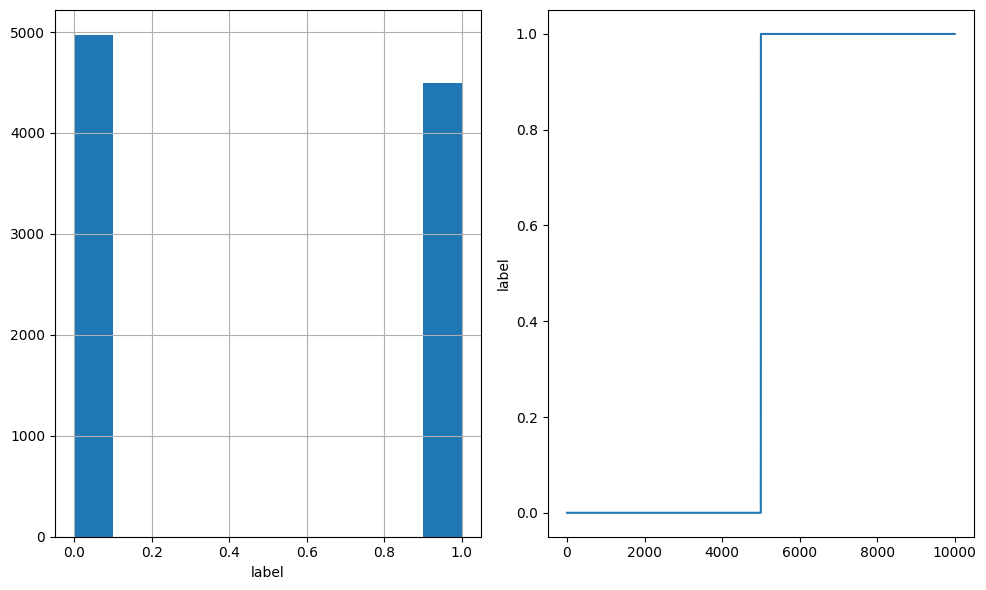

In [66]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.subplot(121)
data['label'].hist()
plt.xlabel('label')
plt.subplot(122)
data['label'].plot()
plt.ylabel('label')
plt.tight_layout()

Tanto con la función `unique()`, como de manera gráfica, se ha mostrado que la variable `label` presenta solo dos valores, indicando una variable categórica binaria.

Se muestran a continuación las estadísticas resumidas para las variables numéricas:

### Estadísticas Descriptivas

In [67]:
# Obtener estadísticas descriptivas de las variables numéricas
estadisticas_numericas = data.describe()

# Obtener la frecuencia de las categorías en la columna 'label'
frecuencia_categorias = data['label'].value_counts()

# Mostrar las estadísticas y la frecuencia de las categorías
print("\nEstadísticas descriptivas de las variables numéricas:")
print(estadisticas_numericas)

print("Frecuencia de las categorías en la columna 'label':")
print(frecuencia_categorias)


Estadísticas descriptivas de las variables numéricas:
                 A            B            C            D            E  \
count  9461.000000  9461.000000  9461.000000  9461.000000  9461.000000   
mean      0.966811    27.519501     5.921573     0.094599     2.061833   
std       1.773650    34.398577     7.436140     0.354723     2.693403   
min       0.000000     0.000000     0.000000     0.000000     0.000000   
25%       0.000000     1.000000     1.000000     0.000000     0.000000   
50%       0.000000     9.000000     3.000000     0.000000     0.000000   
75%       1.000000    48.000000     8.000000     0.000000     6.000000   
max      24.000000   328.000000    88.000000     6.000000     6.000000   

             label          A_t          B_t          C_t          D_t  ...  \
count  9461.000000  9461.000000  9461.000000  9461.000000  9461.000000  ...   
mean      0.474686     0.746055     0.965303     1.076528    -0.235248  ...   
std       0.499385     1.897007     1.691

| Clase | Frecuencia | Porcentaje aproximado |
| ----- | ---------- | --------------------- |
| 0.0   | 4.970      | \~52.5%               |
| 1.0   | 4.491      | \~47.5%               |


Tras la eliminación de valores duplicados, el conjunto de datos contiene 9.461.

La distribución de clases de la variable `label` está razonablemente balanceada, lo que evita la necesidad de aplicar técnicas de balanceo (SMOTE, submuestreo, etc.).

Las variables originales (`A, B, C, D, E`) y derivadas (`A_t a E_t, Valor_1 a Valor_10`) presentan un amplio rango de valores, siendo algunas de ellas susceptibles de contener outliers o colas largas. Por ello se van a analizar sus distribuciones a continuación:

### Detección de Outliers

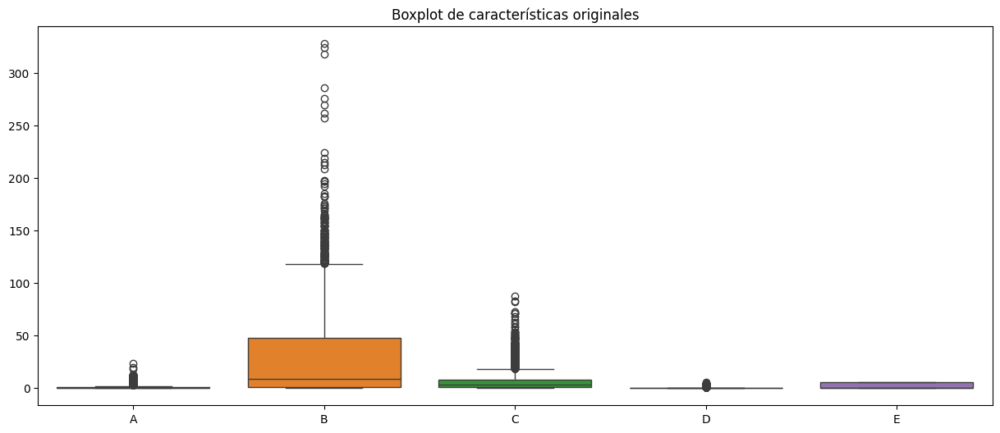

In [68]:
import seaborn as sns

plt.figure(figsize=(15, 6))
sns.boxplot(data=data[['A', 'B', 'C', 'D', 'E']])
plt.title('Boxplot de características originales')
plt.show()

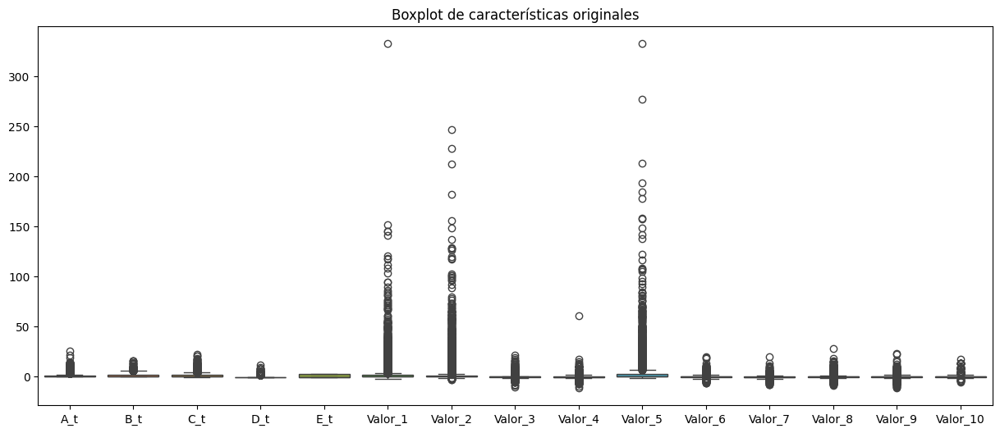

In [69]:
features = ['A_t', 'B_t', 'C_t', 'D_t', 'E_t'] + [f'Valor_{i}' for i in range(1, 11)]

plt.figure(figsize=(15, 6))
sns.boxplot(data=data[features])
plt.title('Boxplot de características originales')
plt.show()

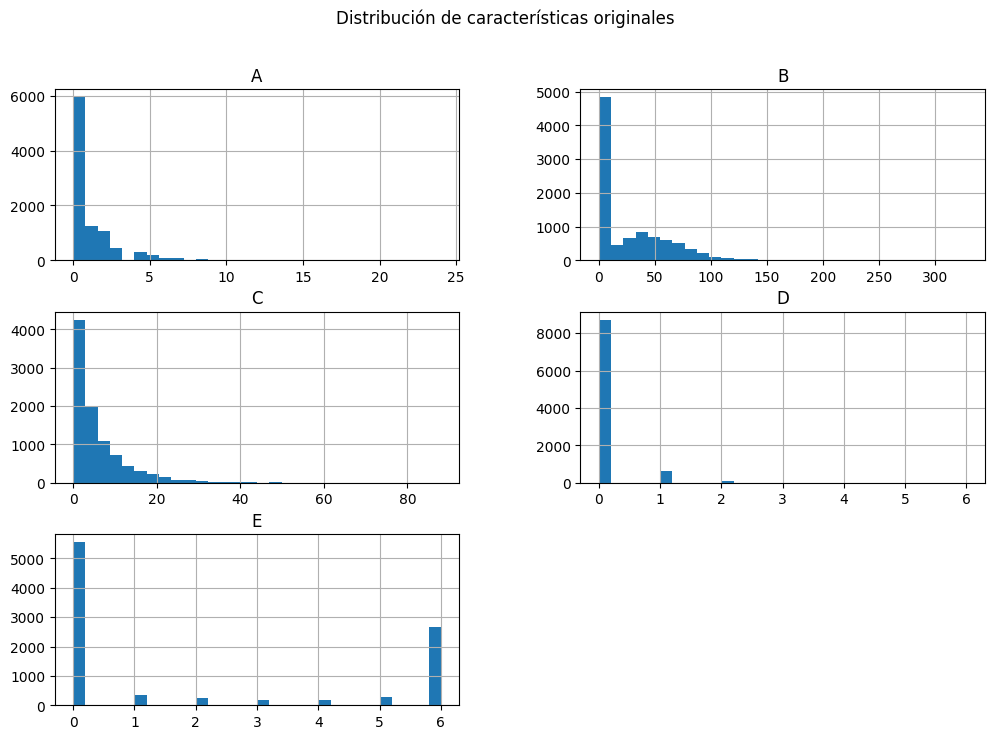

In [70]:
data[['A', 'B', 'C', 'D', 'E']].hist(bins=30, figsize=(12, 8))
plt.suptitle('Distribución de características originales')
plt.show()

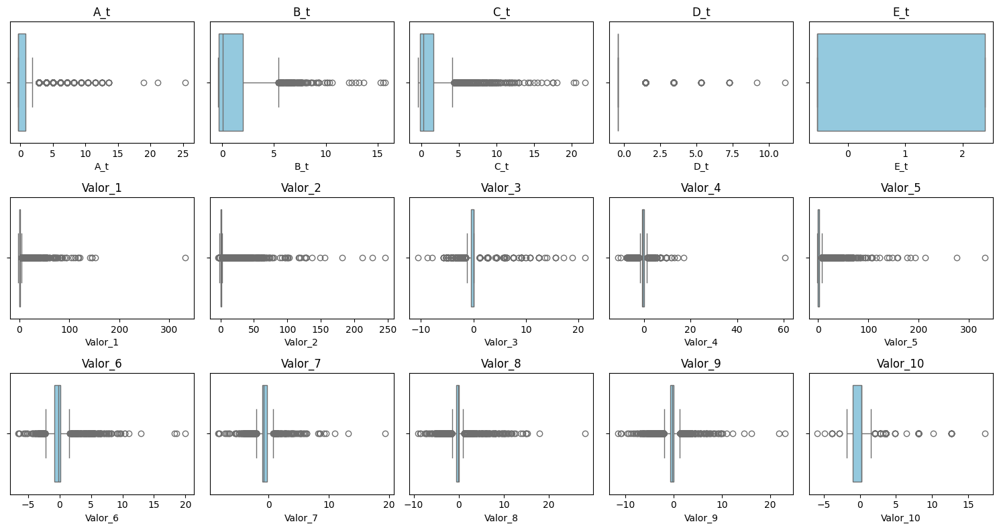

In [71]:
plt.figure(figsize=(15, 8))
for i, feature in enumerate(features, 1):
    plt.subplot(3, 5, i)
    sns.boxplot(x=data[feature], color="skyblue")
    plt.title(feature)
plt.tight_layout()
plt.show()

Para evaluar la presencia de valores extremos en las variables numéricas, se aplicó la regla del rango intercuartílico (IQR).

In [13]:
import numpy as np

def get_outlier_upper_limit (x):
  q1 = np.quantile(x, 0.25)
  q3 = np.quantile(x, 0.75)
  iqr = q3 - q1
  return q3 + 1.5 * iqr

numericas = data.select_dtypes(include='number').columns

for c in numericas:
  mask = data[c].values > get_outlier_upper_limit(data[c].values)
  print(f"{c}: n_outliers: {mask.sum()} percent_outliers: {mask.sum()*100/len(mask)}%")

A: n_outliers: 1220 percent_outliers: 12.895042807314237%
B: n_outliers: 163 percent_outliers: 1.722862276714935%
C: n_outliers: 597 percent_outliers: 6.310115209808688%
D: n_outliers: 753 percent_outliers: 7.958989535989853%
E: n_outliers: 0 percent_outliers: 0.0%
label: n_outliers: 0 percent_outliers: 0.0%
A_t: n_outliers: 1220 percent_outliers: 12.895042807314237%
B_t: n_outliers: 163 percent_outliers: 1.722862276714935%
C_t: n_outliers: 597 percent_outliers: 6.310115209808688%
D_t: n_outliers: 753 percent_outliers: 7.958989535989853%
E_t: n_outliers: 0 percent_outliers: 0.0%
Valor_1: n_outliers: 1580 percent_outliers: 16.70013740619385%
Valor_2: n_outliers: 1645 percent_outliers: 17.387168375436%
Valor_3: n_outliers: 215 percent_outliers: 2.2724870521086564%
Valor_4: n_outliers: 444 percent_outliers: 4.692950005284853%
Valor_5: n_outliers: 1300 percent_outliers: 13.74061938484304%
Valor_6: n_outliers: 187 percent_outliers: 1.9765352499735758%
Valor_7: n_outliers: 109 percent_outlie

- Las variables `Valor_1` y `Valor_2` son las que mayor proporción de outliers presentan (~17%), posiblemente debido a combinaciones no lineales de variables con gran varianza.
- Variables como `Valor_5` y `A` también presentan una proporción alta de valores extremos (>12%).
- Otras variables, como `Valor_3`, `Valor_6`, `Valor_7`, `Valor_8` y `B`, tienen un porcentaje bajo (< 3%) de outliers, indicando distribuciones más contenidas.
- Variables como `E`, `E_t` y `label` son estables y sin valores atípicos, lo que es coherente con su naturaleza (sentimiento discreto o variable categórica).



### Dispersión y Distribución por Clase

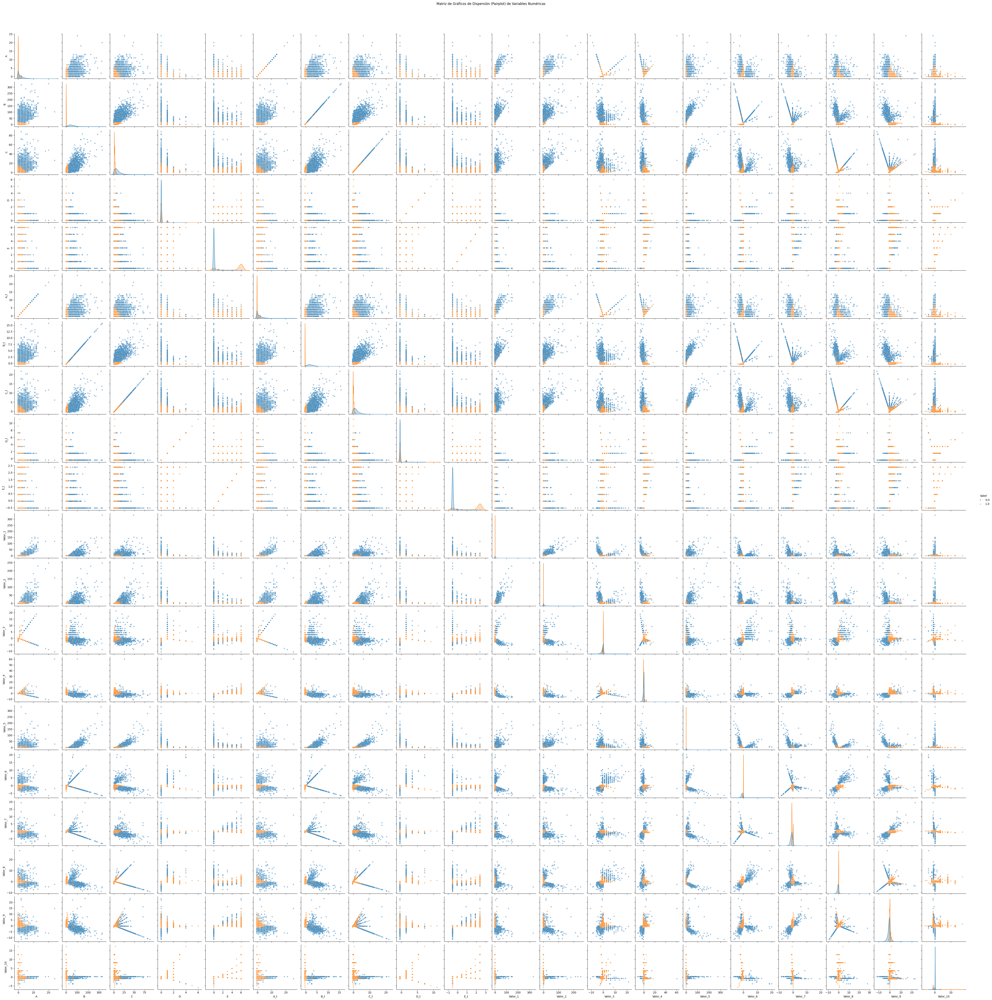

In [15]:
# Crear una matriz de gráficos de dispersión (pairplot)
numericas = data.select_dtypes(include='number').columns.tolist()
if 'label' not in numericas:
  numericas.append('label')

sns.pairplot(data[numericas], hue='label', plot_kws={'alpha':0.5, 's':20})

plt.suptitle("Matriz de Gráficos de Dispersión (Pairplot) de Variables Numéricas", y=1.02)
plt.show()

En los gráficos de dispersión, se observan cuatro tipos de patrones frecuentes:
- Líneas horizontales o verticales.
- Puntos aglomerados en ciertas zonas.
- Relaciones lineales claras entre variables originales y estandarizadas.
- Variables derivadas que muestran un patrón centrado, con ramas lineales divergentes.

### Selección de Variables Relevantes

Dado que se trata de un problema de clasificación, no se utiliza una matriz de correlación tradicional. En su lugar, se emplea un modelo de árboles (Random Forest) para obtener la importancia de características, más adecuado para este tipo de problema.

Importancia de características:
B_t         0.238657
B           0.227838
Valor_6     0.128021
Valor_5     0.110418
C_t         0.048804
E_t         0.046538
E           0.043193
C           0.028876
Valor_10    0.027256
Valor_7     0.024932
Valor_8     0.014107
Valor_9     0.013785
D           0.012821
Valor_1     0.011397
D_t         0.008076
Valor_2     0.006376
Valor_4     0.003165
Valor_3     0.003157
A           0.001711
A_t         0.000872
dtype: float64


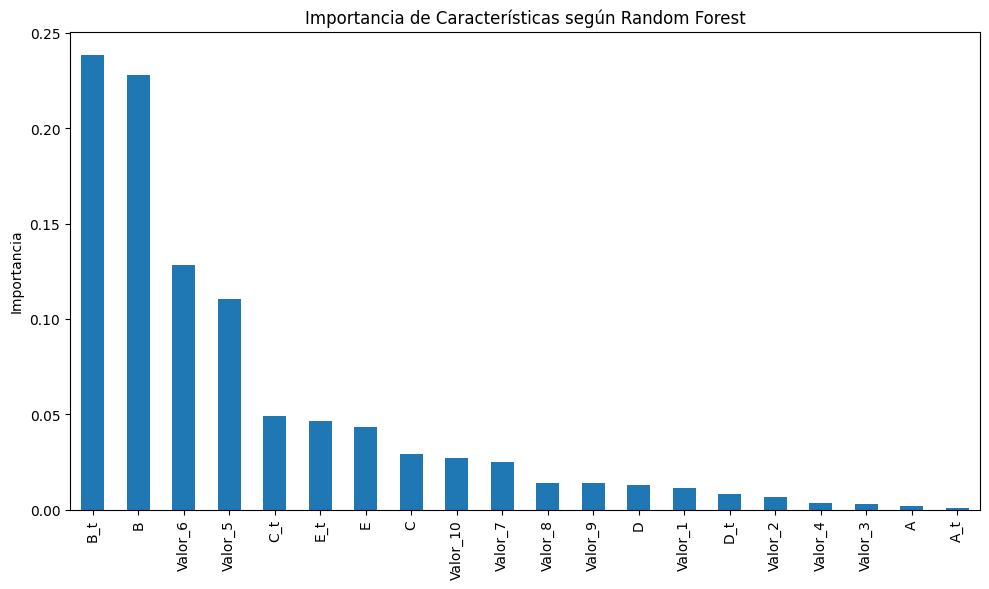

In [76]:
from sklearn.ensemble import RandomForestClassifier

X = data[numericas].drop('label', axis=1)
y = data['label']

rf = RandomForestClassifier(random_state=42)
rf.fit(X, y)

importancias = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)
print("Importancia de características:")
print(importancias)

plt.figure(figsize=(10, 6))
importancias.plot(kind='bar')
plt.title('Importancia de Características según Random Forest')
plt.ylabel('Importancia')
plt.tight_layout()
plt.show()

Las variables más relevantes son `B_t` y `B`, seguidas por `Valor_6` y `Valor_5`. Las variables `A` y `A_t`, en cambio, tienen poca influencia en la clasificación.

### Comportamiento por Clase (label)

In [18]:
import plotly.io as pio
import plotly.express as px

pio.templates.default = "plotly_white"

for c in numericas:
  fig = px.histogram(data, x=c, color='label')
  fig.show()

- **Variables A, B, C y D:** muestran que la clase `label=1` tiende a presentar valores más bajos, mientras que `label=0` se asocia a valores más altos.
- **Variable E:** tiene una frecuencia más alta para `label=1` a lo largo de su distribución.
- **Variables derivadas:** la clase `label=1` se concentra en torno a valores cercanos a cero, mientras que `label=0` muestra una distribución más dispersa.
Esto sugiere que los casos de la clase 1 son más homogéneos y centrados, mientras que los de la clase 0 presentan mayor variabilidad.

In [20]:
print(data.head())
# Eliminar columnas que empiecen por 'Valor_' y la columna 'comentario'
columnas_a_eliminar = [col for col in data.columns if col.startswith('Valor_') or col == 'comentario']
data = data.drop(columns=columnas_a_eliminar)
# Mostrar las primeras filas del nuevo dataframe para verificar
print(data.head())

   A   B   C  D  E  label       A_t       B_t        C_t       D_t       E_t
0  2  64  30  0  2    0.0  1.851102  2.759647   7.145831 -0.416577  0.440638
1  4  70  21  0  0    0.0  3.990202  3.054765   4.877255 -0.416577 -0.531099
2  4  88  50  0  0    0.0  3.990202  3.940120  12.187108 -0.416577 -0.531099
3  3  38  21  0  0    0.0  2.920652  1.480801   4.877255 -0.416577 -0.531099
4  0  59  17  0  0    0.0 -0.287998  2.513715   3.869000 -0.416577 -0.531099
   A   B   C  D  E  label       A_t       B_t        C_t       D_t       E_t
0  2  64  30  0  2    0.0  1.851102  2.759647   7.145831 -0.416577  0.440638
1  4  70  21  0  0    0.0  3.990202  3.054765   4.877255 -0.416577 -0.531099
2  4  88  50  0  0    0.0  3.990202  3.940120  12.187108 -0.416577 -0.531099
3  3  38  21  0  0    0.0  2.920652  1.480801   4.877255 -0.416577 -0.531099
4  0  59  17  0  0    0.0 -0.287998  2.513715   3.869000 -0.416577 -0.531099


### Transformaciones y Comparación de Escalas

Se generan tres versiones de las variables del conjunto de datos para un análisis comparativo posterior:
- **Original**: Sin modificar de las variables A-E
- **t_estandarizadas**: Versión estandarizada previamente por transformaciones aplicadas antes de este análisis.
- **std_calculadas**: Estandarización aplicada desde cero usando `StandardScaler`.

In [21]:
# Estandarizar las columnas, excepto 'label'
from sklearn.preprocessing import StandardScaler

original = ['A', 'B', 'C', 'D', 'E']

df_original = data[original].copy()

df_t = data[[f"{col}_t" for col in original]].copy()
df_t.columns = original

scaler = StandardScaler()
df_std = pd.DataFrame(scaler.fit_transform(df_original), columns=[f"{col}_std" for col in original])

df_std_renamed = df_std.copy()
df_std_renamed.columns = original

comparacion_dict = {
    'original': df_original,
    't_estandarizadas': df_t,
    'std_calculadas': df_std_renamed
}

label_column = data['label'].copy()

for key in comparacion_dict.keys():
    comparacion_dict[key]['label'] = label_column

for key, df_version in comparacion_dict.items():
    print(f"\n--- {key} ---")
    print(df_version.describe())


--- original ---
                 A            B            C            D            E  \
count  9461.000000  9461.000000  9461.000000  9461.000000  9461.000000   
mean      0.966811    27.519501     5.921573     0.094599     2.061833   
std       1.773650    34.398577     7.436140     0.354723     2.693403   
min       0.000000     0.000000     0.000000     0.000000     0.000000   
25%       0.000000     1.000000     1.000000     0.000000     0.000000   
50%       0.000000     9.000000     3.000000     0.000000     0.000000   
75%       1.000000    48.000000     8.000000     0.000000     6.000000   
max      24.000000   328.000000    88.000000     6.000000     6.000000   

             label  
count  9461.000000  
mean      0.474686  
std       0.499385  
min       0.000000  
25%       0.000000  
50%       0.000000  
75%       1.000000  
max       1.000000  

--- t_estandarizadas ---
                 A            B            C            D            E  \
count  9461.000000  9461.0

Las transformaciones muestran diferencias claras:
- **Original**: Las variables presentan distribuciones con alta dispersión y valores máximos elevados.
- **t_estandarizadas**: Las variables ya habían sido transformadas y presentan una escala más controlada. Sin embargo, no presentan media 0 ni desviación estándar 1.
- **std_calculadas**: Tras aplicar `StandardScaler`, se obtuvieron variables con media cercana a 0 y desviación estándar ≈ 1.

### Matriz de Covarianza

In [23]:
for key, dataset in comparacion_dict.items():
  cov_matrix = dataset.drop(columns='label').cov()
  print(f"Matriz de covarianza para datos {key}:\n", cov_matrix)

Matriz de covarianza para datos original:
            A            B           C         D          E
A   3.145833    35.614601    6.864099 -0.023710  -1.448476
B  35.614601  1183.262120  200.789373 -1.070820 -50.972295
C   6.864099   200.789373   55.296174 -0.108753  -7.156144
D  -0.023710    -1.070820   -0.108753  0.125828   0.101127
E  -1.448476   -50.972295   -7.156144  0.101127   7.254422
Matriz de covarianza para datos t_estandarizadas:
           A         B         C         D         E
A  3.598635  1.873588  1.850526 -0.048609 -0.752716
B  1.873588  2.862667  2.489409 -0.100959 -1.218141
C  1.850526  2.489409  3.513309 -0.052546 -0.876412
D -0.048609 -0.100959 -0.052546  0.462319  0.094182
E -0.752716 -1.218141 -0.876412  0.094182  1.712536
Matriz de covarianza para datos std_calculadas:
           A         B         C         D         E
A  1.000106  0.583802  0.520492 -0.037689 -0.303241
B  0.583802  1.000106  0.785052 -0.087767 -0.550222
C  0.520492  0.785052  1.000106 -0.

- **Original**: Tienen escalas muy distintas y con alta covarianza.
- **t_estandarizadas**: No todas las variables tienen varianza 1, pero están más homogeneizadas que los datos originales.
- **std_calculadas**: Diagonal = 1.0, como es esperado.

Esto valida que la estandarización calculada (`std_calculadas`) es la más apropiada si se desea comparar variables en una misma escala o aplicar técnicas sensibles a la magnitud.

In [77]:
# Separar las características y las etiquetas
X_dict = {}
y_dict = {}

for key, df in comparacion_dict.items():
    if 'label' in df.columns:
        X_dict[key] = df.drop(columns=['label'])
        y_dict[key] = df['label']
    else:
        print(f"Advertencia: el DataFrame '{key}' no contiene la columna 'label'")

for key in comparacion_dict.keys():
    print(f"{key}: X shape = {X_dict[key].shape}, y shape = {y_dict[key].shape}")

original: X shape = (9461, 5), y shape = (9461,)
t_estandarizadas: X shape = (9461, 5), y shape = (9461,)
std_calculadas: X shape = (9461, 5), y shape = (9461,)


### PCA

In [78]:
# Aplicar PCA
# Crear un DataFrame con los resultados de PCA
from sklearn.decomposition import PCA

pca_resultados = {}

for nombre, X in X_dict.items():
    pca = PCA(n_components=0.9)
    componentes = pca.fit_transform(X)

    df_pca = pd.DataFrame(componentes, columns=[f'PC{i+1}' for i in range(componentes.shape[1])])

    pca_resultados[nombre] = {
        'pca_model': pca,
        'componentes': componentes,
        'df_pca': df_pca,
        'explained_variance': pca.explained_variance_,
        'explained_variance_ratio': pca.explained_variance_ratio_,
        'cargas': pd.DataFrame(pca.components_, columns=X.columns, index=[f'PC{i+1}' for i in range(componentes.shape[1])])
    }

Saltando original: solo hay 1 componente(s).


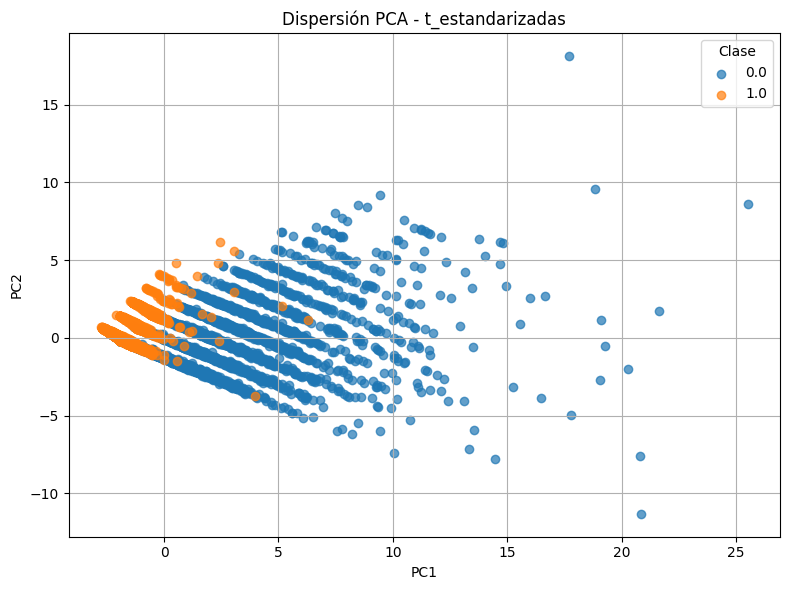

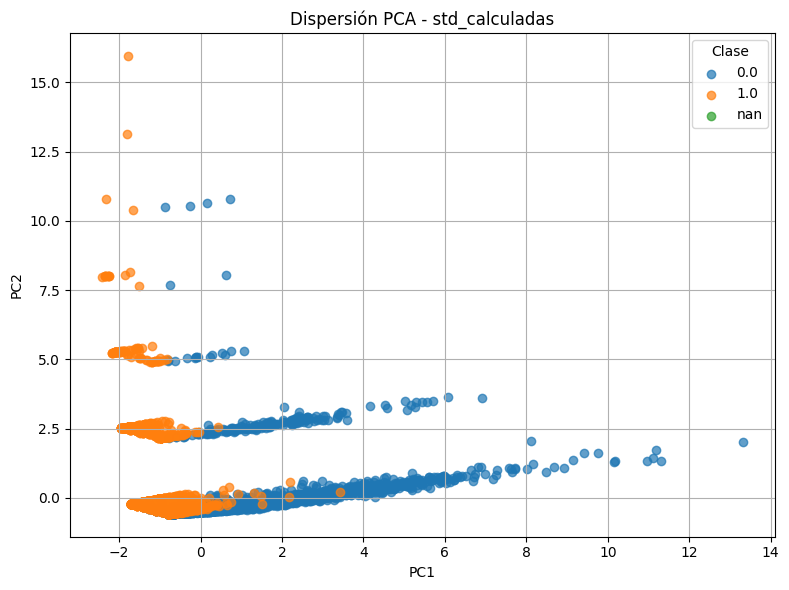

In [79]:
for nombre in pca_resultados:
    X_pca = pca_resultados[nombre]['componentes']
    y = y_dict[nombre]

    if X_pca.shape[1] < 2:
        print(f"Saltando {nombre}: solo hay {X_pca.shape[1]} componente(s).")
        continue

    plt.figure(figsize=(8, 6))

    clases = np.unique(y)

    for clase in clases:
        indices = y == clase
        plt.scatter(
            X_pca[indices, 0],
            X_pca[indices, 1],
            label=str(clase),
            alpha=0.7
        )

    plt.title(f'Dispersión PCA - {nombre}')
    plt.xlabel('PC1')
    plt.ylabel('PC2')
    plt.grid(True)
    plt.legend(title='Clase')
    plt.tight_layout()
    plt.show()

En `std_calculadas`, los puntos están más agrupados y definidos, con menos ruido o valores atípicos visuales, lo que podría deberse a un mejor control de escala y dispersión.

### Análisis por conjunto

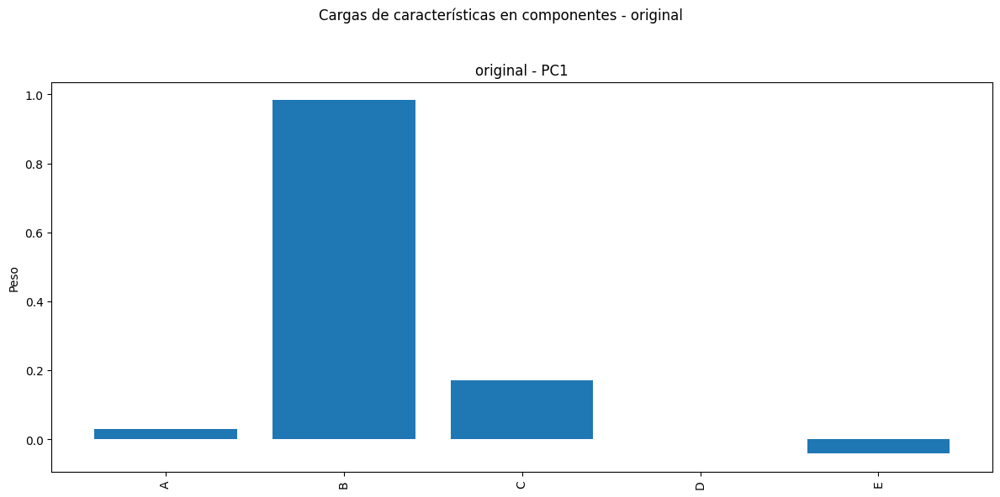

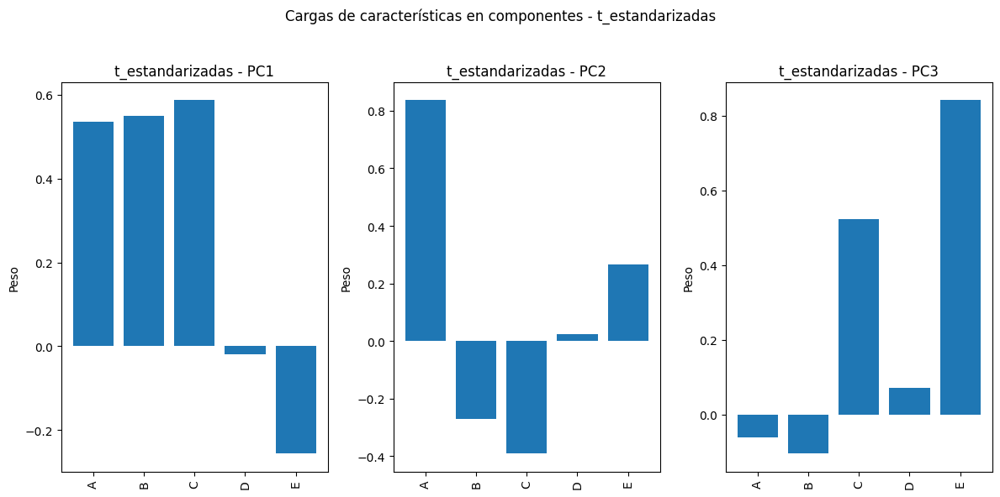

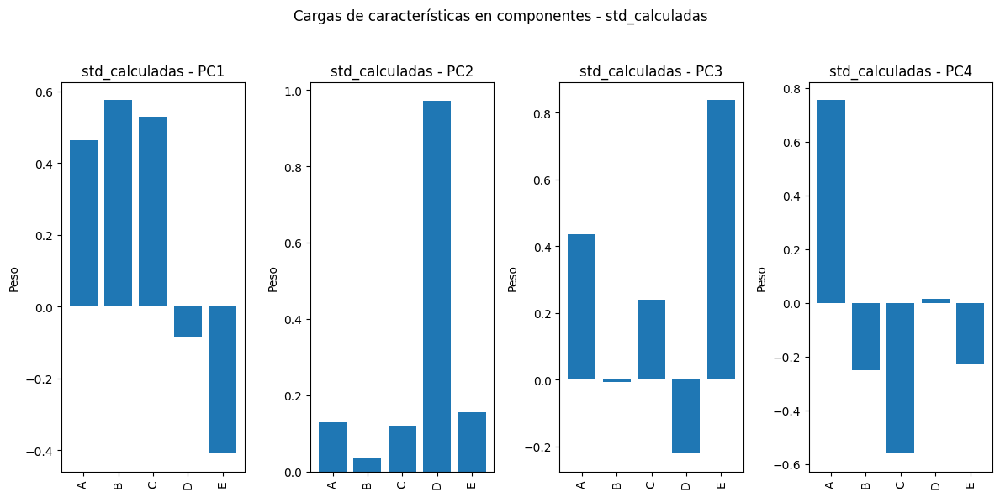

In [80]:
for nombre, resultados in pca_resultados.items():
    cargas = resultados['cargas']

    plt.figure(figsize=(12, 6))

    for i, pc in enumerate(cargas.index):
        plt.subplot(1, len(cargas), i+1)
        plt.bar(cargas.columns, cargas.loc[pc])
        plt.title(f'{nombre} - {pc}')
        plt.xticks(rotation=90)
        plt.ylabel('Peso')

    plt.suptitle(f'Cargas de características en componentes - {nombre}')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


Resultados para conjunto: original
Contribución de cada Componente Principal (PC):
  PC1: 97.77% de la varianza total

Autovalores (Valores Propios):
  Autovalor 1: 1221.2031

Autovectores (Vectores Propios):
  Autovector 1: [ 2.97817772e-02  9.84097188e-01  1.69913989e-01 -8.82220142e-04
 -4.23583370e-02]


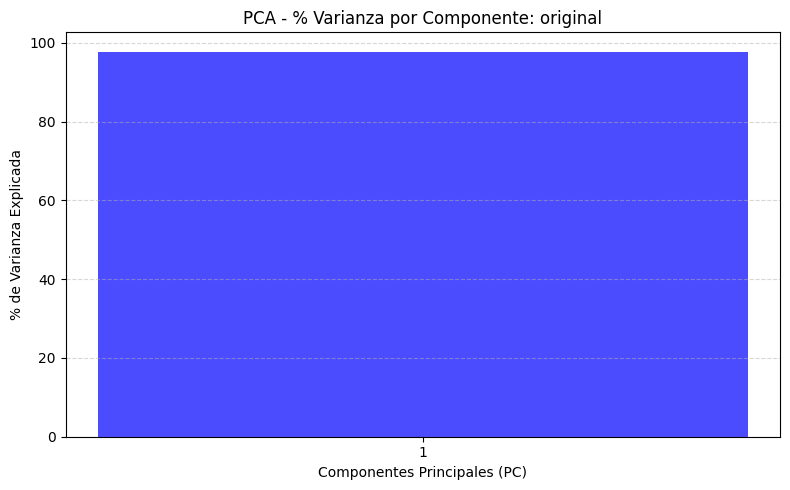


Resultados para conjunto: t_estandarizadas
Contribución de cada Componente Principal (PC):
  PC1: 65.15% de la varianza total
  PC2: 15.51% de la varianza total
  PC3: 11.37% de la varianza total

Autovalores (Valores Propios):
  Autovalor 1: 7.9155
  Autovalor 2: 1.8839
  Autovalor 3: 1.3819

Autovectores (Vectores Propios):
  Autovector 1: [ 0.53535143  0.54999492  0.58729484 -0.01831992 -0.25622957]
  Autovector 2: [ 0.83722534 -0.27139937 -0.39165893  0.02283613  0.26735353]
  Autovector 3: [-0.06024879 -0.10453413  0.52208894  0.07099721  0.8413235 ]


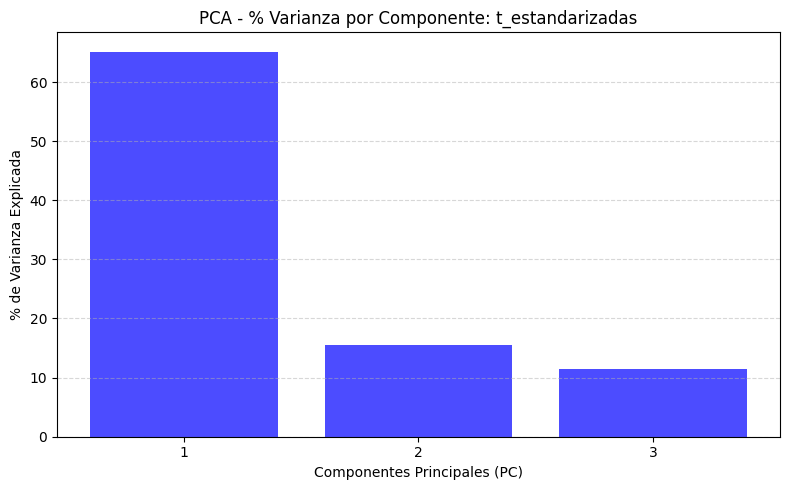


Resultados para conjunto: std_calculadas
Contribución de cada Componente Principal (PC):
  PC1: 51.90% de la varianza total
  PC2: 20.07% de la varianza total
  PC3: 14.31% de la varianza total
  PC4: 10.17% de la varianza total

Autovalores (Valores Propios):
  Autovalor 1: 2.5954
  Autovalor 2: 1.0035
  Autovalor 3: 0.7158
  Autovalor 4: 0.5088

Autovectores (Vectores Propios):
  Autovector 1: [ 0.46294045  0.5755083   0.52831183 -0.08348208 -0.410358  ]
  Autovector 2: [0.12949916 0.03606831 0.12081832 0.97129967 0.15462509]
  Autovector 3: [ 0.43528515 -0.00596996  0.24144981 -0.22134196  0.83857076]
  Autovector 4: [ 0.7544615  -0.25167862 -0.56154099  0.01487151 -0.22780753]


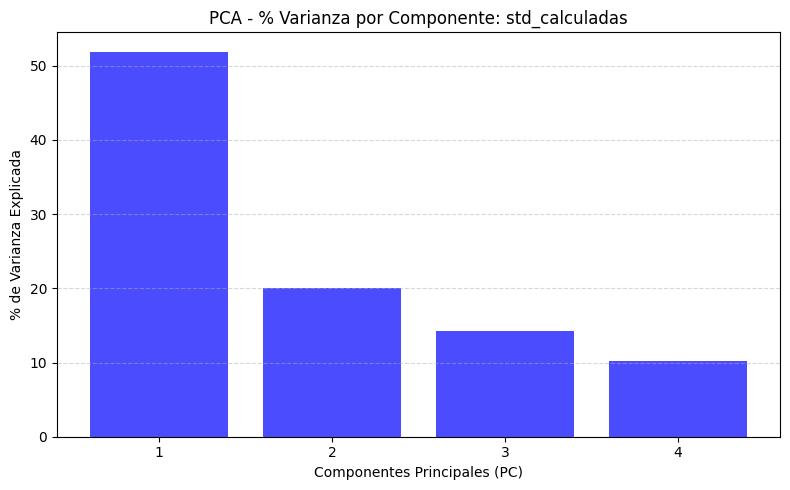

In [81]:
# Visualizar los resultados de PCA
for nombre, resultados in pca_resultados.items():
    print(f"\nResultados para conjunto: {nombre}")

    explained_variances = resultados['explained_variance_ratio']
    eigenvalues = resultados['explained_variance']
    eigenvectors = resultados['pca_model'].components_
    pcs = np.arange(1, len(explained_variances) + 1)

    print("Contribución de cada Componente Principal (PC):")
    for i, variance in enumerate(explained_variances):
        print(f"  PC{i+1}: {variance*100:.2f}% de la varianza total")

    print("\nAutovalores (Valores Propios):")
    for i, eigenvalue in enumerate(eigenvalues):
        print(f"  Autovalor {i+1}: {eigenvalue:.4f}")

    print("\nAutovectores (Vectores Propios):")
    for i, eigenvector in enumerate(eigenvectors):
        print(f"  Autovector {i+1}: {eigenvector}")

    plt.figure(figsize=(8, 5))
    plt.bar(pcs, explained_variances * 100, color='blue', alpha=0.7)
    plt.xlabel('Componentes Principales (PC)')
    plt.ylabel('% de Varianza Explicada')
    plt.title(f'PCA - % Varianza por Componente: {nombre}')
    plt.xticks(pcs)
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

- **original**
  - **Varianza explicada:** PC1 explica el 97.77%, lo que indica una fuerte dominancia de una sola dimensión.
  - Autovalor alto y único componente dominante.
  - **Cargas:** B es claramente dominante (~0.98), lo que sugiere que la variable B encapsula casi toda la varianza del conjunto original.

  Los datos sin estandarizar están dominados por B (posiblemente porque está en una escala mayor), lo que distorsiona el análisis.

- **t_estandarizadas**
  - 3 componentes capturan el ~92% de la varianza.
    - **PC1 (65.15%):** A, B y C aportan fuertemente.
    - **PC2 (15.51%):** Predomina A.
    - **PC3 (11.37%):** Fuerte carga de E y C (con cambio de signo respecto a PC1).
  - Cargas balanceadas con algunas diferencias significativas entre PCs.

  Hay estructura multivariada significativa, y los datos están bien representados por 3 componentes.

- **std_calculadas**
  - 4 componentes necesarios para superar el 90% (96.45%).
    - PC1 (51.9%): Todas menos D tienen carga notable.
    - PC2 (20%): Dominada por D.
    - PC3 (14.31%): Principalmente E y B.
    - PC4 (10.17%): A y C, con algo de D.

  Aunque algo más dispersa que `t_estandarizadas`, hay contribuciones más diferenciadas y presencia de todas las variables en distintas PCs. D, que estaba ausente en PC1 en otros casos, aquí se expresa claramente en PC2 y PC4.


--- Resultados para conjunto: original ---

Modelo: RandomForest
  Accuracy Train: 0.9846
  Accuracy Test: 0.9704
  F1-score Train: 0.9838
  F1-score Test: 0.9690
  Reporte de Clasificación Train:
{'0.0': {'precision': 0.9884326200115674, 'recall': 0.982183908045977, 'f1-score': 0.9852983568751802, 'support': 3480.0}, '1.0': {'precision': 0.9804045512010113, 'recall': 0.9872692552514322, 'f1-score': 0.9838249286393911, 'support': 3142.0}, 'accuracy': 0.9845967985502869, 'macro avg': {'precision': 0.9844185856062894, 'recall': 0.9847265816487045, 'f1-score': 0.9845616427572856, 'support': 6622.0}, 'weighted avg': {'precision': 0.984623469875239, 'recall': 0.9845967985502869, 'f1-score': 0.984599246105496, 'support': 6622.0}}
  Reporte de Clasificación Test:
{'0.0': {'precision': 0.9743589743589743, 'recall': 0.9691275167785235, 'f1-score': 0.971736204576043, 'support': 1490.0}, '1.0': {'precision': 0.9661016949152542, 'recall': 0.971830985915493, 'f1-score': 0.9689578713968958, 'suppor

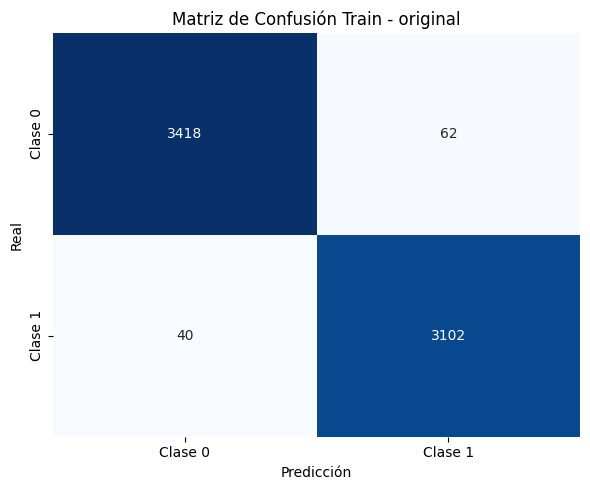

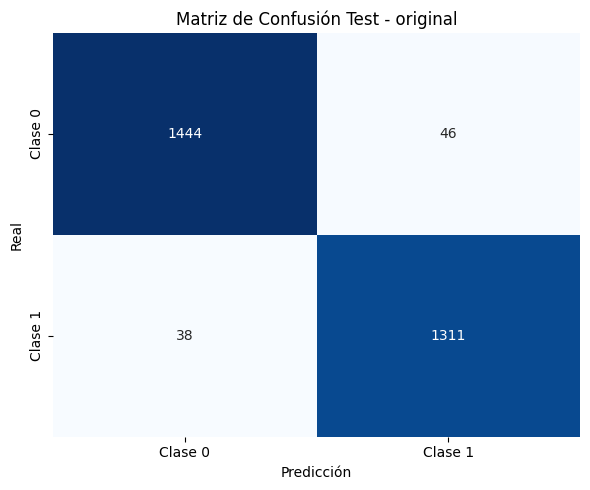


Modelo: LogisticRegression
  Accuracy Train: 0.9613
  Accuracy Test: 0.9623
  F1-score Train: 0.9602
  F1-score Test: 0.9613
  Reporte de Clasificación Train:
{'0.0': {'precision': 0.9849578820697954, 'recall': 0.9408045977011494, 'f1-score': 0.9623750734861846, 'support': 3480.0}, '1.0': {'precision': 0.9375379017586416, 'recall': 0.9840865690642903, 'f1-score': 0.9602484472049689, 'support': 3142.0}, 'accuracy': 0.9613409845967985, 'macro avg': {'precision': 0.9612478919142184, 'recall': 0.9624455833827199, 'f1-score': 0.9613117603455767, 'support': 6622.0}, 'weighted avg': {'precision': 0.9624580967877591, 'recall': 0.9613409845967985, 'f1-score': 0.9613660339549887, 'support': 6622.0}}
  Reporte de Clasificación Test:
{'0.0': {'precision': 0.9852631578947368, 'recall': 0.9422818791946309, 'f1-score': 0.9632933104631218, 'support': 1490.0}, '1.0': {'precision': 0.9391796322489392, 'recall': 0.9844329132690882, 'f1-score': 0.9612739775606225, 'support': 1349.0}, 'accuracy': 0.962310

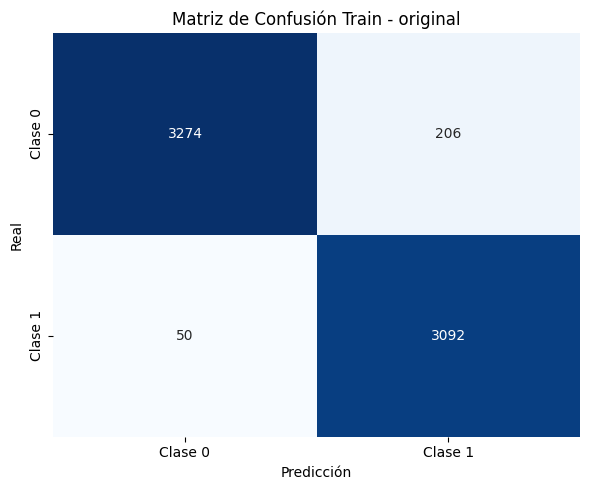

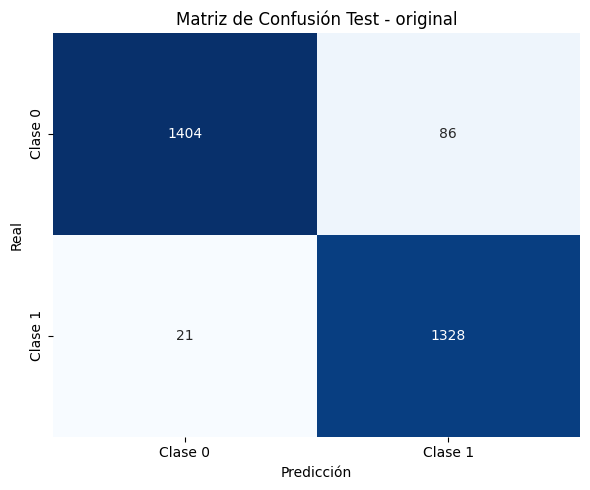


Modelo: KNN
  Accuracy Train: 0.9712
  Accuracy Test: 0.9687
  F1-score Train: 0.9694
  F1-score Test: 0.9669
  Reporte de Clasificación Train:
{'0.0': {'precision': 0.9665248226950355, 'recall': 0.9790229885057471, 'f1-score': 0.9727337615988579, 'support': 3480.0}, '1.0': {'precision': 0.9764288020665159, 'recall': 0.962444302991725, 'f1-score': 0.969386119570444, 'support': 3142.0}, 'accuracy': 0.9711567502265177, 'macro avg': {'precision': 0.9714768123807758, 'recall': 0.9707336457487361, 'f1-score': 0.971059940584651, 'support': 6622.0}, 'weighted avg': {'precision': 0.9712240530159645, 'recall': 0.9711567502265177, 'f1-score': 0.971145375725515, 'support': 6622.0}}
  Reporte de Clasificación Test:
{'0.0': {'precision': 0.9673115410273516, 'recall': 0.9731543624161074, 'f1-score': 0.9702241552358648, 'support': 1490.0}, '1.0': {'precision': 0.9701492537313433, 'recall': 0.9636767976278725, 'f1-score': 0.9669021941242097, 'support': 1349.0}, 'accuracy': 0.9686509334272632, 'macro 

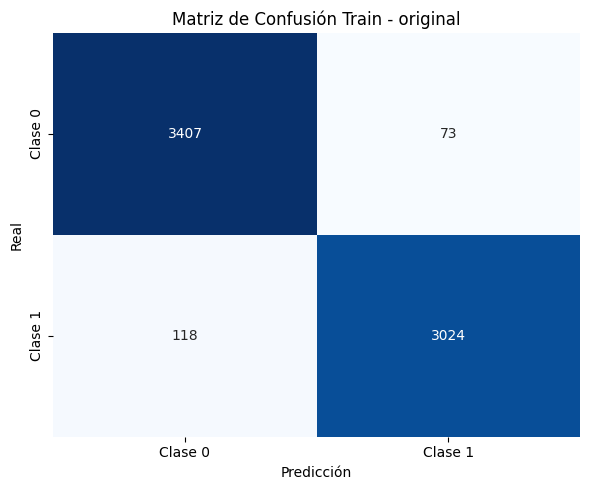

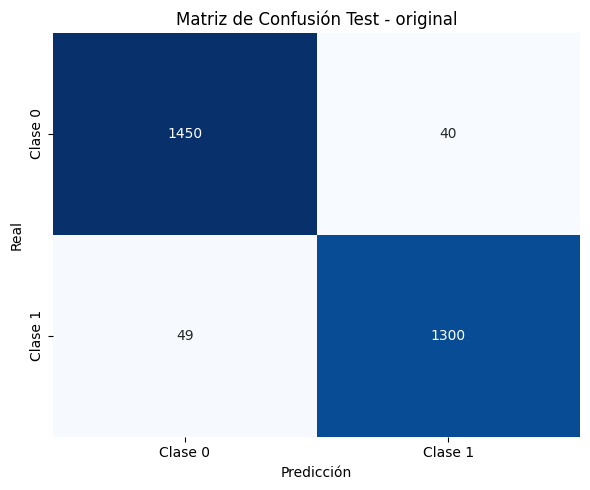


Modelo: SVM
  Accuracy Train: 0.9606
  Accuracy Test: 0.9613
  F1-score Train: 0.9596
  F1-score Test: 0.9602
  Reporte de Clasificación Train:
{'0.0': {'precision': 0.9861069163394744, 'recall': 0.9382183908045977, 'f1-score': 0.961566779561184, 'support': 3480.0}, '1.0': {'precision': 0.935064935064935, 'recall': 0.9853596435391471, 'f1-score': 0.9595536959553695, 'support': 3142.0}, 'accuracy': 0.9605859257022048, 'macro avg': {'precision': 0.9605859257022047, 'recall': 0.9617890171718724, 'f1-score': 0.9605602377582767, 'support': 6622.0}, 'weighted avg': {'precision': 0.96188856762842, 'recall': 0.9605859257022048, 'f1-score': 0.9606116136461329, 'support': 6622.0}}
  Reporte de Clasificación Test:
{'0.0': {'precision': 0.9852320675105485, 'recall': 0.9402684563758389, 'f1-score': 0.9622252747252747, 'support': 1490.0}, '1.0': {'precision': 0.9371912491178547, 'recall': 0.9844329132690882, 'f1-score': 0.9602313810556761, 'support': 1349.0}, 'accuracy': 0.9612539626629095, 'macro 

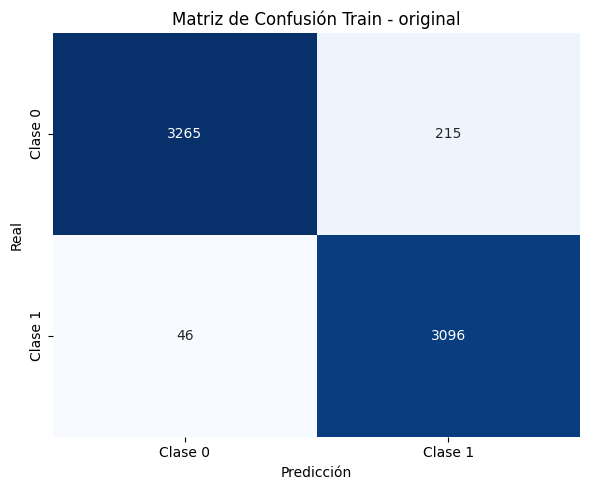

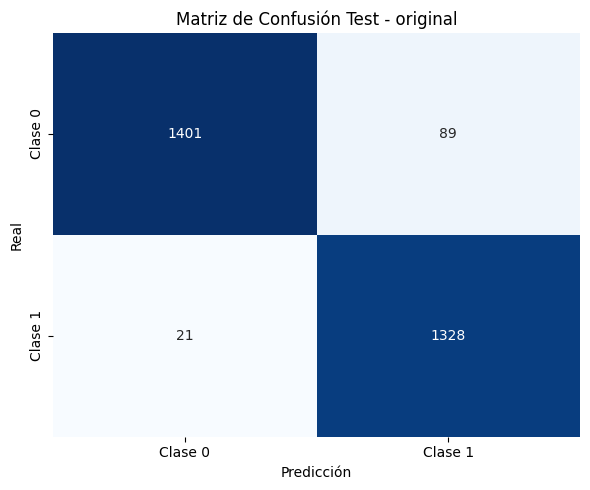


--- Resultados para conjunto: t_estandarizadas ---

Modelo: RandomForest
  Accuracy Train: 0.9846
  Accuracy Test: 0.9725
  F1-score Train: 0.9838
  F1-score Test: 0.9713
  Reporte de Clasificación Train:
{'0.0': {'precision': 0.9878682842287695, 'recall': 0.9827586206896551, 'f1-score': 0.9853068280034573, 'support': 3480.0}, '1.0': {'precision': 0.9810126582278481, 'recall': 0.9866327180140039, 'f1-score': 0.9838146620120597, 'support': 3142.0}, 'accuracy': 0.9845967985502869, 'macro avg': {'precision': 0.9844404712283088, 'recall': 0.9846956693518295, 'f1-score': 0.9845607450077585, 'support': 6622.0}, 'weighted avg': {'precision': 0.9846154335952909, 'recall': 0.9845967985502869, 'f1-score': 0.9845988265620541, 'support': 6622.0}}
  Reporte de Clasificación Test:
{'0.0': {'precision': 0.9796195652173914, 'recall': 0.9677852348993289, 'f1-score': 0.9736664415935179, 'support': 1490.0}, '1.0': {'precision': 0.9648866130212144, 'recall': 0.977761304670126, 'f1-score': 0.9712812960235

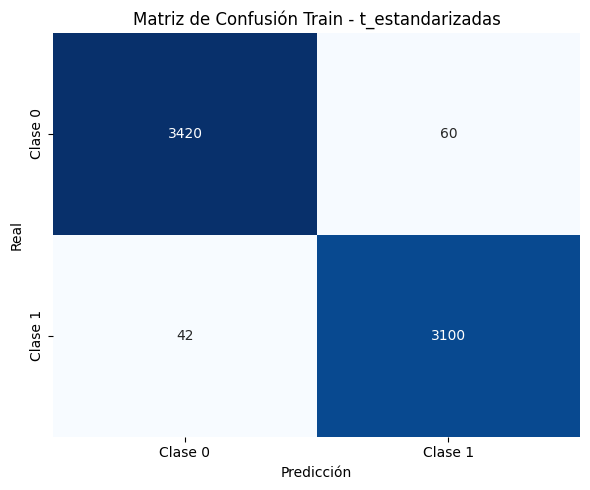

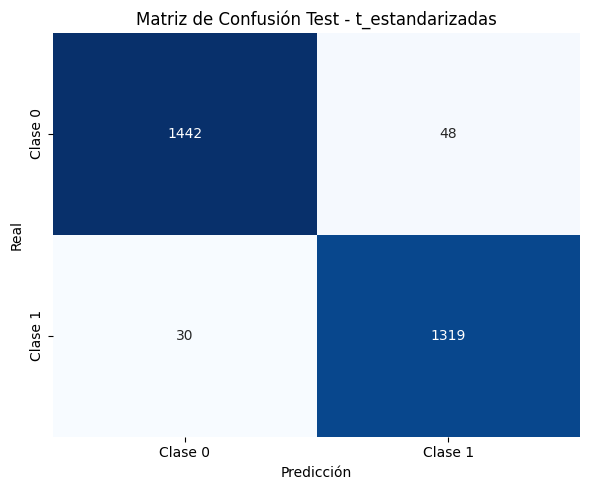


Modelo: LogisticRegression
  Accuracy Train: 0.9550
  Accuracy Test: 0.9581
  F1-score Train: 0.9535
  F1-score Test: 0.9567
  Reporte de Clasificación Train:
{'0.0': {'precision': 0.9732302201070792, 'recall': 0.9402298850574713, 'f1-score': 0.9564454837766735, 'support': 3480.0}, '1.0': {'precision': 0.9361963190184049, 'recall': 0.9713558243157224, 'f1-score': 0.9534520462355514, 'support': 3142.0}, 'accuracy': 0.9549984898822108, 'macro avg': {'precision': 0.954713269562742, 'recall': 0.9557928546865968, 'f1-score': 0.9549487650061124, 'support': 6622.0}, 'weighted avg': {'precision': 0.9556584114056875, 'recall': 0.9549984898822108, 'f1-score': 0.9550251604975727, 'support': 6622.0}}
  Reporte de Clasificación Test:
{'0.0': {'precision': 0.9770354906054279, 'recall': 0.9422818791946309, 'f1-score': 0.9593440382644346, 'support': 1490.0}, '1.0': {'precision': 0.9386590584878745, 'recall': 0.9755374351371386, 'f1-score': 0.9567430025445293, 'support': 1349.0}, 'accuracy': 0.9580838

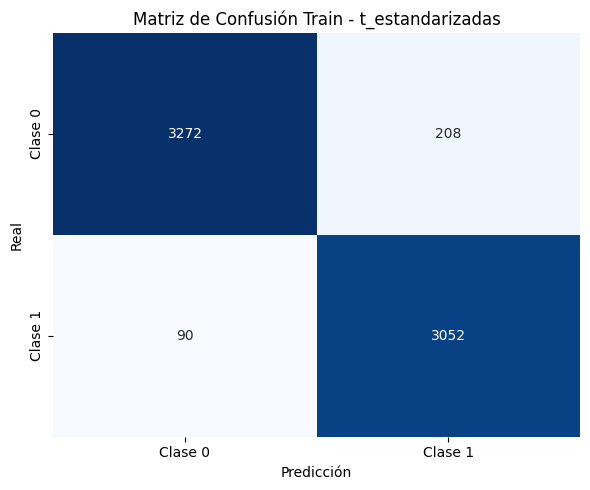

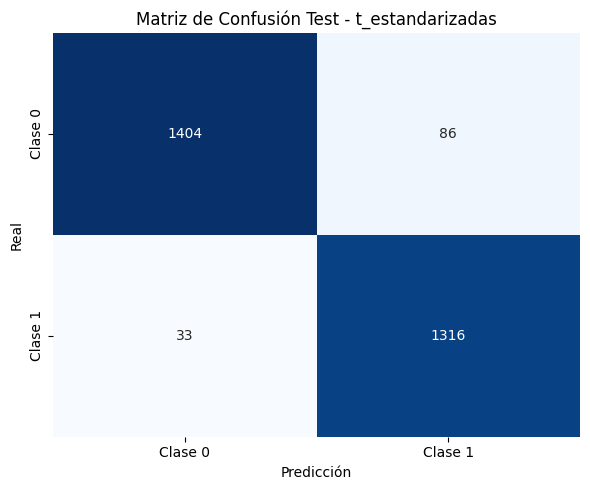


Modelo: KNN
  Accuracy Train: 0.9755
  Accuracy Test: 0.9736
  F1-score Train: 0.9742
  F1-score Test: 0.9724
  Reporte de Clasificación Train:
{'0.0': {'precision': 0.9775474956822107, 'recall': 0.9758620689655172, 'f1-score': 0.9767040552200172, 'support': 3480.0}, '1.0': {'precision': 0.9733163913595934, 'recall': 0.9751750477402928, 'f1-score': 0.9742448330683625, 'support': 3142.0}, 'accuracy': 0.9755360918151615, 'macro avg': {'precision': 0.975431943520902, 'recall': 0.975518558352905, 'f1-score': 0.9754744441441898, 'support': 6622.0}, 'weighted avg': {'precision': 0.9755399254947048, 'recall': 0.9755360918151615, 'f1-score': 0.9755372059296972, 'support': 6622.0}}
  Reporte de Clasificación Test:
{'0.0': {'precision': 0.9816201497617427, 'recall': 0.9677852348993289, 'f1-score': 0.9746535991889151, 'support': 1490.0}, '1.0': {'precision': 0.964963503649635, 'recall': 0.9799851742031134, 'f1-score': 0.9724163295329166, 'support': 1349.0}, 'accuracy': 0.9735822472701655, 'macro

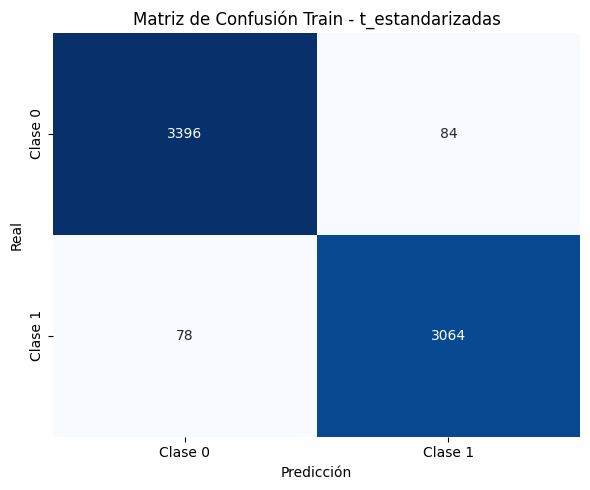

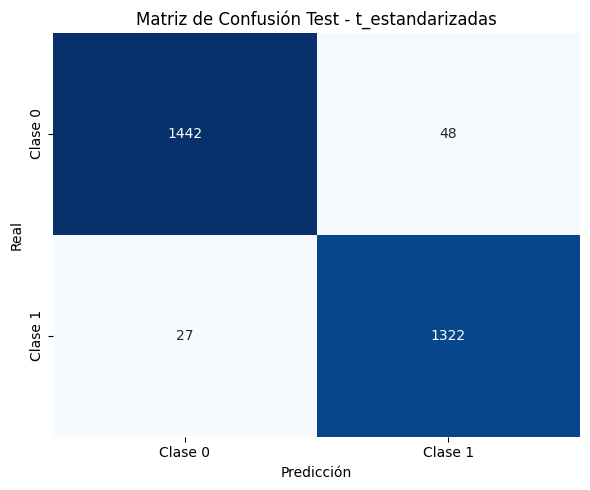


Modelo: SVM
  Accuracy Train: 0.9577
  Accuracy Test: 0.9563
  F1-score Train: 0.9569
  F1-score Test: 0.9554
  Reporte de Clasificación Train:
{'0.0': {'precision': 0.9892966360856269, 'recall': 0.9295977011494253, 'f1-score': 0.9585185185185185, 'support': 3480.0}, '1.0': {'precision': 0.926909307875895, 'recall': 0.9888605983450032, 'f1-score': 0.9568832768709578, 'support': 3142.0}, 'accuracy': 0.9577167019027484, 'macro avg': {'precision': 0.958102971980761, 'recall': 0.9592291497472143, 'f1-score': 0.9577008976947381, 'support': 6622.0}, 'weighted avg': {'precision': 0.9596951583998857, 'recall': 0.9577167019027484, 'f1-score': 0.9577426306815152, 'support': 6622.0}}
  Reporte de Clasificación Test:
{'0.0': {'precision': 0.9850852272727273, 'recall': 0.9308724832214765, 'f1-score': 0.9572118702553485, 'support': 1490.0}, '1.0': {'precision': 0.9280223619846262, 'recall': 0.9844329132690882, 'f1-score': 0.9553956834532374, 'support': 1349.0}, 'accuracy': 0.9563226488200071, 'macr

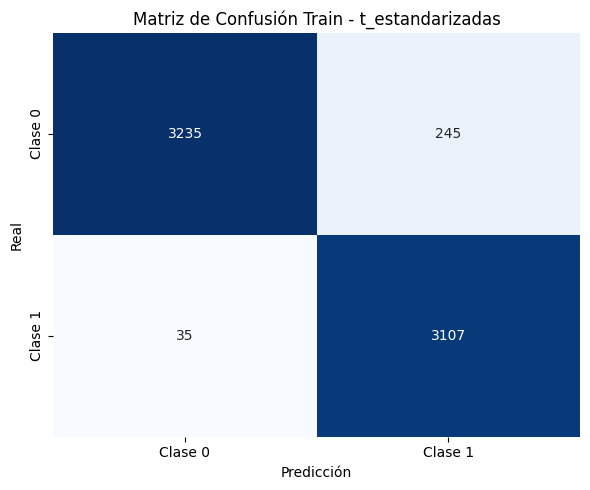

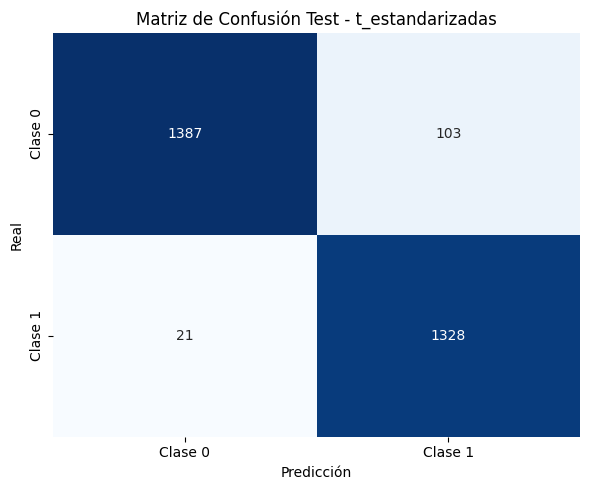


--- Resultados para conjunto: std_calculadas ---

Modelo: RandomForest
  Accuracy Train: 0.9835
  Accuracy Test: 0.9659
  F1-score Train: 0.9814
  F1-score Test: 0.9633
  Reporte de Clasificación Train:
{'0.0': {'precision': 0.9907834101382489, 'recall': 0.979498861047836, 'f1-score': 0.9851088201603666, 'support': 3512.0}, '1.0': {'precision': 0.9744408945686901, 'recall': 0.988476773496579, 'f1-score': 0.9814086521272792, 'support': 2777.0}, 'accuracy': 0.9834631896962951, 'macro avg': {'precision': 0.9826121523534694, 'recall': 0.9839878172722075, 'f1-score': 0.983258736143823, 'support': 6289.0}, 'weighted avg': {'precision': 0.9835671331885487, 'recall': 0.9834631896962951, 'f1-score': 0.9834749568072287, 'support': 6289.0}}
  Reporte de Clasificación Test:
{'0.0': {'precision': 0.9776223776223776, 'recall': 0.9588477366255144, 'f1-score': 0.9681440443213296, 'support': 1458.0}, '1.0': {'precision': 0.95260663507109, 'recall': 0.9741518578352181, 'f1-score': 0.963258785942492, 's

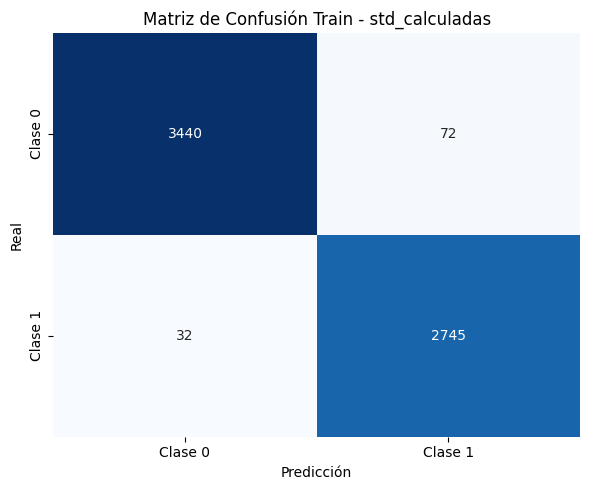

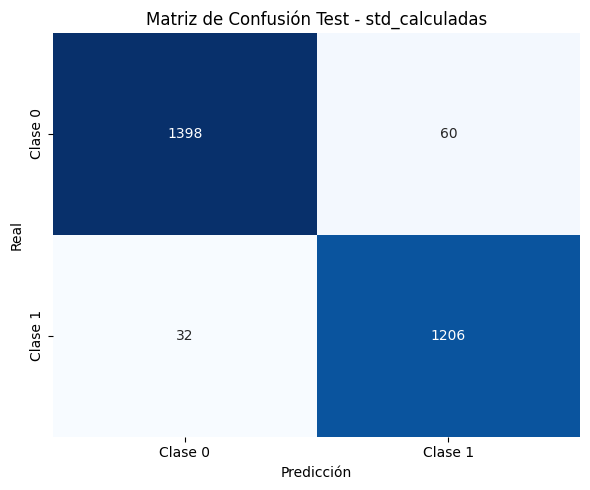


Modelo: LogisticRegression
  Accuracy Train: 0.9467
  Accuracy Test: 0.9470
  F1-score Train: 0.9406
  F1-score Test: 0.9433
  Reporte de Clasificación Train:
{'0.0': {'precision': 0.9637956204379562, 'recall': 0.9399202733485194, 'f1-score': 0.9517082312238719, 'support': 3512.0}, '1.0': {'precision': 0.9263268156424581, 'recall': 0.9553474972992438, 'f1-score': 0.9406133664243929, 'support': 2777.0}, 'accuracy': 0.9467323898871045, 'macro avg': {'precision': 0.9450612180402072, 'recall': 0.9476338853238816, 'f1-score': 0.9461607988241324, 'support': 6289.0}, 'weighted avg': {'precision': 0.947250721262078, 'recall': 0.9467323898871045, 'f1-score': 0.9468091312798184, 'support': 6289.0}}
  Reporte de Clasificación Test:
{'0.0': {'precision': 0.9659815733522324, 'recall': 0.9348422496570644, 'f1-score': 0.9501568490763332, 'support': 1458.0}, '1.0': {'precision': 0.9260700389105059, 'recall': 0.9612277867528272, 'f1-score': 0.9433214427269124, 'support': 1238.0}, 'accuracy': 0.9469584

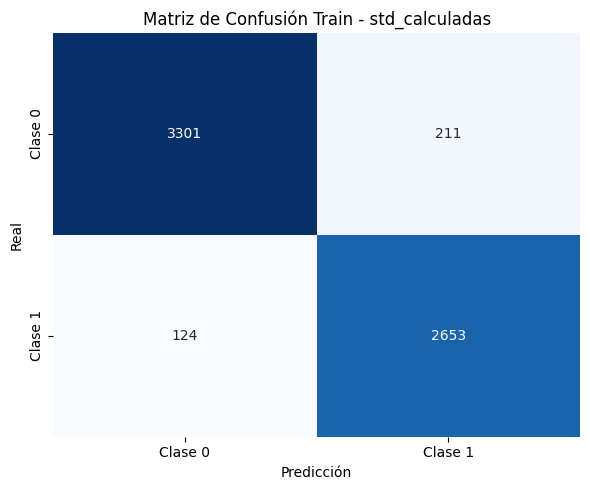

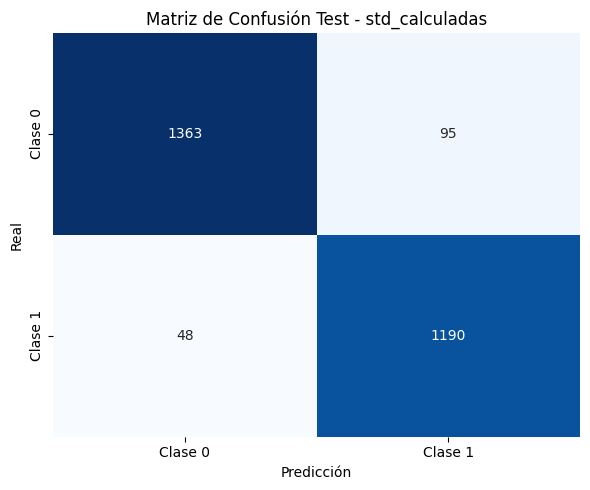


Modelo: KNN
  Accuracy Train: 0.9711
  Accuracy Test: 0.9640
  F1-score Train: 0.9671
  F1-score Test: 0.9610
  Reporte de Clasificación Train:
{'0.0': {'precision': 0.9703389830508474, 'recall': 0.9780751708428246, 'f1-score': 0.9741917186613727, 'support': 3512.0}, '1.0': {'precision': 0.971989814477992, 'recall': 0.96218941303565, 'f1-score': 0.9670647846543612, 'support': 2777.0}, 'accuracy': 0.9710605819685164, 'macro avg': {'precision': 0.9711643987644197, 'recall': 0.9701322919392372, 'f1-score': 0.9706282516578669, 'support': 6289.0}, 'weighted avg': {'precision': 0.9710679318301734, 'recall': 0.9710605819685164, 'f1-score': 0.9710447166360154, 'support': 6289.0}}
  Reporte de Clasificación Test:
{'0.0': {'precision': 0.9696342305037957, 'recall': 0.9636488340192044, 'f1-score': 0.9666322669418644, 'support': 1458.0}, '1.0': {'precision': 0.9574979951884522, 'recall': 0.9644588045234249, 'f1-score': 0.9609657947686117, 'support': 1238.0}, 'accuracy': 0.9640207715133531, 'macro

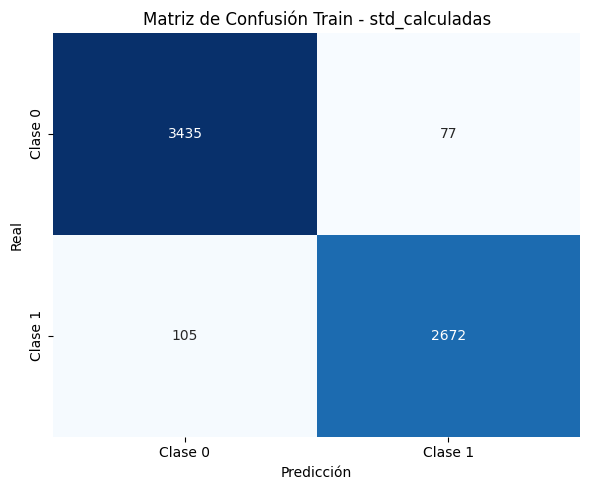

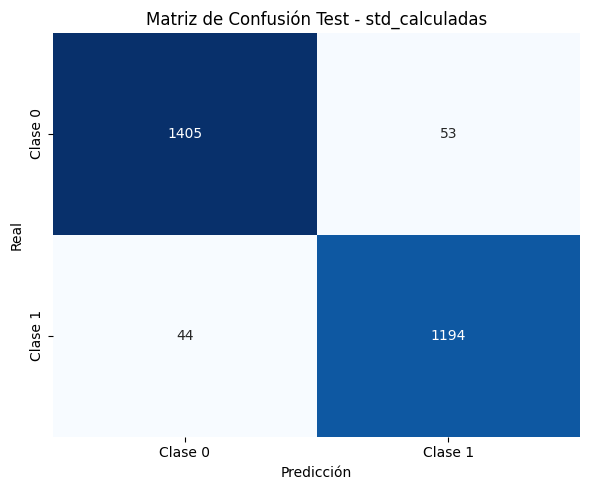


Modelo: SVM
  Accuracy Train: 0.9450
  Accuracy Test: 0.9429
  F1-score Train: 0.9401
  F1-score Test: 0.9398
  Reporte de Clasificación Train:
{'0.0': {'precision': 0.9817407181984176, 'recall': 0.9185649202733486, 'f1-score': 0.9491026772580171, 'support': 3512.0}, '1.0': {'precision': 0.9047619047619048, 'recall': 0.9783939503060857, 'f1-score': 0.9401384083044982, 'support': 2777.0}, 'accuracy': 0.9449833041819049, 'macro avg': {'precision': 0.9432513114801612, 'recall': 0.9484794352897171, 'f1-score': 0.9446205427812577, 'support': 6289.0}, 'weighted avg': {'precision': 0.947749596412252, 'recall': 0.9449833041819049, 'f1-score': 0.9451443730945694, 'support': 6289.0}}
  Reporte de Clasificación Test:
{'0.0': {'precision': 0.9738372093023255, 'recall': 0.9190672153635117, 'f1-score': 0.9456598447424136, 'support': 1458.0}, '1.0': {'precision': 0.9106060606060606, 'recall': 0.9709208400646203, 'f1-score': 0.9397967161845192, 'support': 1238.0}, 'accuracy': 0.9428783382789317, 'mac

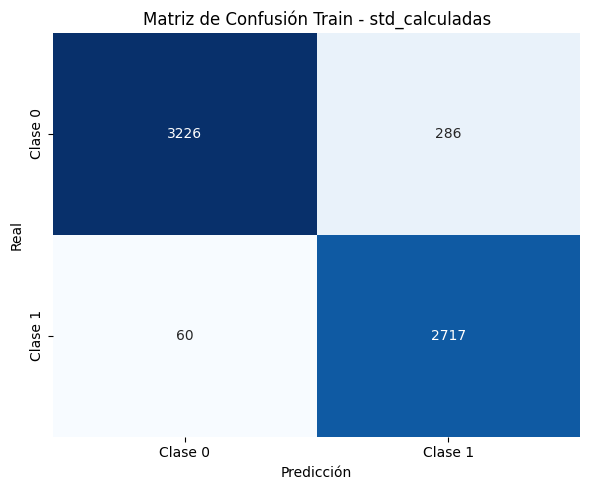

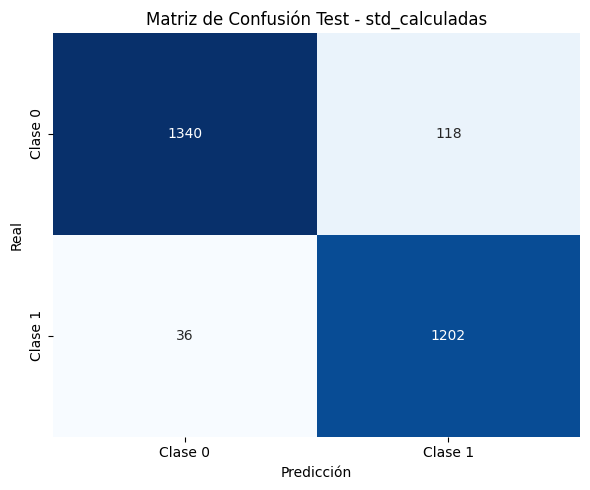

In [84]:
# Dividir los datos en conjunto de entrenamiento y prueba
# Entrenar un modelo de clasificación (por ejemplo, RandomForest)
# Predecir y evaluar el modelo
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.metrics import accuracy_score, f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

resultados_modelos = {}

modelos = {
    'RandomForest': RandomForestClassifier(random_state=42),
    'LogisticRegression': LogisticRegression(max_iter=1000, random_state=42),
    'KNN': KNeighborsClassifier(n_neighbors=5),
    'SVM': SVC()
}

for nombre, resultado in pca_resultados.items():
    if nombre not in y_dict:
        print(f"\nEtiquetas no disponibles para '{nombre}', se omite.")
        continue

    X_pca = resultado['componentes']
    y = y_dict[nombre]

    mask = ~y.isna()
    X_pca = X_pca[mask]
    y = y[mask]

    X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.3, random_state=42)

    print(f"\n--- Resultados para conjunto: {nombre} ---")

    resultados_modelos[nombre] = {}

    for modelo_nombre, modelo in modelos.items():
        modelo.fit(X_train, y_train)
        y_pred = modelo.predict(X_test)
        y_train_pred = modelo.predict(X_train)
        acc = accuracy_score(y_test, y_pred)
        acc_train = accuracy_score(y_train, y_train_pred)
        f1 = f1_score(y_test, y_pred)
        f1_train = f1_score(y_train, y_train_pred)
        cm = confusion_matrix(y_test, y_pred)
        cm_train = confusion_matrix(y_train, y_train_pred)
        cr = classification_report(y_test, y_pred, output_dict=True)
        cr_train = classification_report(y_train, y_train_pred, output_dict=True)

        print(f"\nModelo: {modelo_nombre}")
        print(f"  Accuracy Train: {acc_train:.4f}")
        print(f"  Accuracy Test: {acc:.4f}")
        print(f"  F1-score Train: {f1_train:.4f}")
        print(f"  F1-score Test: {f1:.4f}")
        print("  Reporte de Clasificación Train:")
        print(cr_train)
        print("  Reporte de Clasificación Test:")
        print(cr)

        plt.figure(figsize=(6, 5))
        sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', cbar=False,
                    xticklabels=['Clase 0', 'Clase 1'], yticklabels=['Clase 0', 'Clase 1'])
        plt.title(f"Matriz de Confusión Train - {nombre}")
        plt.xlabel("Predicción")
        plt.ylabel("Real")
        plt.tight_layout()
        plt.show()

        plt.figure(figsize=(6, 5))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
                    xticklabels=['Clase 0', 'Clase 1'], yticklabels=['Clase 0', 'Clase 1'])
        plt.title(f"Matriz de Confusión Test - {nombre}")
        plt.xlabel("Predicción")
        plt.ylabel("Real")
        plt.tight_layout()
        plt.show()

        resultados_modelos[nombre][modelo_nombre] = {
            "modelo": modelo,
            "accuracy_train": acc_train,
            "accuracy_test": acc,
            "f1_score_train": f1_train,
            "f1_score_test": f1,
        }

- **Modelo más balanceado y confiable:** Random Forest con `t_estandarizadas`.
  - Alta precisión, estabilidad entre train y test, bajo overfitting.
- **Mejor modelo en rendimiento** (Accuracy y F1): KNN con `t_estandarizadas`.
  - A considerar si la eficiencia computacional no es un problema (KNN puede ser lento con grandes volúmenes).
- Evita usar std_calculadas. En general, el rendimiento es menor en todos los modelos.


#### Analice los resultados obtenidos por PCA

Los resultados muestran que el modelo de Random Forest es consistentemente el más preciso y equilibrado en todos los conjuntos de datos, destacándose especialmente en términos de accuracy y f1-score tanto en entrenamiento como en prueba. La estandarización de los datos mejora ligeramente el rendimiento general de los modelos, especialmente en el caso del conjunto t_estandarizadas. Sin embargo, las diferencias entre modelos son pequeñas, por lo que Random Forest se consolida como la mejor opción para esta tarea, con un desempeño robusto y estable frente a variaciones en los datos y en su transformación.

### t-SNE


Visualización t-SNE para: original


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.



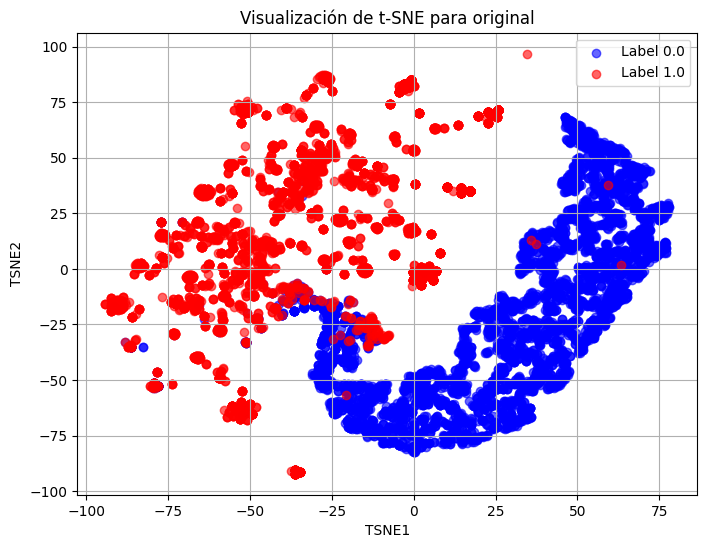


Visualización t-SNE para: t_estandarizadas


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.



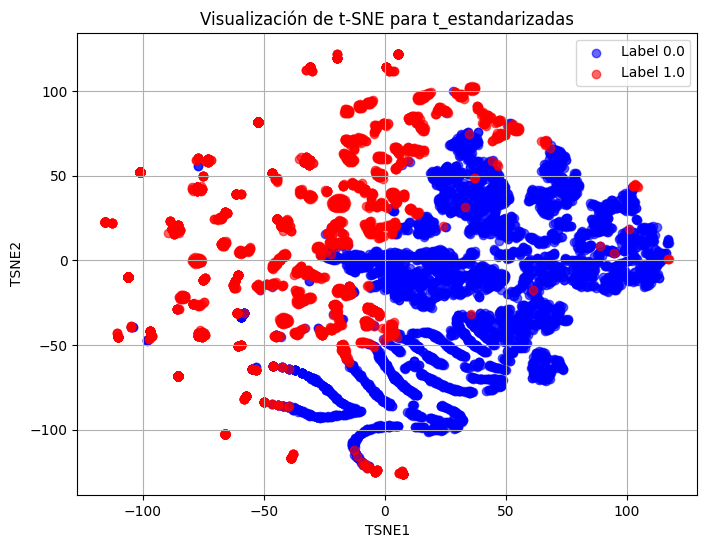


Visualización t-SNE para: std_calculadas


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.



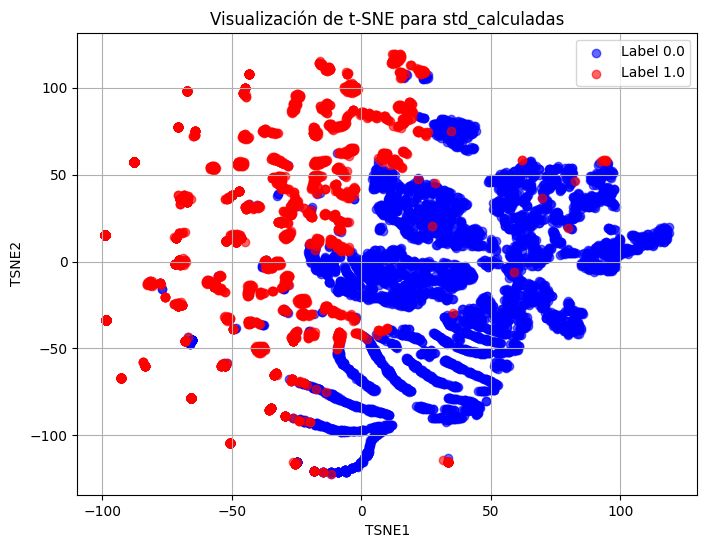

In [85]:
# Aplicar t-SNE
# Crear un DataFrame con los resultados de t-SNE
# Visualizar los resultados de t-SNE
from sklearn.manifold import TSNE

colors = {0: 'blue', 1: 'red'}
tsne_resultados = {}

for nombre, X in X_dict.items():
    print(f"\nVisualización t-SNE para: {nombre}")
    y_subset = y_dict[nombre]
    mask = y_subset.notna()
    X = X[mask]
    y_subset = y_subset[mask]
    tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
    X_tsne = tsne.fit_transform(X)

    tsne_resultados[nombre] = {
        'X_tsne': X_tsne,
        'labels': y_subset.values
    }

    df_tsne = pd.DataFrame(X_tsne, columns=['TSNE1', 'TSNE2'])
    df_tsne['label'] = y_subset.values

    plt.figure(figsize=(8, 6))
    for label in df_tsne['label'].unique():
        subset = df_tsne[df_tsne['label'] == label]
        plt.scatter(subset['TSNE1'], subset['TSNE2'], c=colors[label], label=f'Label {label}', alpha=0.6)
    plt.legend()
    plt.title(f"Visualización de t-SNE para {nombre}")
    plt.xlabel("TSNE1")
    plt.ylabel("TSNE2")
    plt.grid(True)
    plt.show()

In [86]:
for nombre, resultados in tsne_resultados.items():
    print(f"\nResultados para conjunto: {nombre}")

    X_tsne = resultados['X_tsne']
    labels = resultados['labels']

    print(f"Dimensiones de la proyección t-SNE: {X_tsne.shape}")
    print(f"Número de clases en labels: {len(set(labels))}")

    print("Estadísticas de las dimensiones t-SNE:")
    print(f"  TSNE1 - media: {X_tsne[:,0].mean():.4f}, std: {X_tsne[:,0].std():.4f}")
    print(f"  TSNE2 - media: {X_tsne[:,1].mean():.4f}, std: {X_tsne[:,1].std():.4f}")


Resultados para conjunto: original
Dimensiones de la proyección t-SNE: (9461, 2)
Número de clases en labels: 2
Estadísticas de las dimensiones t-SNE:
  TSNE1 - media: 0.3692, std: 42.9863
  TSNE2 - media: -0.2729, std: 44.1730

Resultados para conjunto: t_estandarizadas
Dimensiones de la proyección t-SNE: (9461, 2)
Número de clases en labels: 2
Estadísticas de las dimensiones t-SNE:
  TSNE1 - media: -1.9806, std: 56.7644
  TSNE2 - media: 0.7043, std: 54.5624

Resultados para conjunto: std_calculadas
Dimensiones de la proyección t-SNE: (8985, 2)
Número de clases en labels: 2
Estadísticas de las dimensiones t-SNE:
  TSNE1 - media: -1.9359, std: 54.9776
  TSNE2 - media: -0.3593, std: 53.5404


#### Analice los resultados obtenidos por t-SNE

- **t-SNE sin estandarizar**: Las clases están bien diferenciadas. Hay una separación visible entre ambos grupos. El grupo azul se extiende más, mientras que el rojo está más concentrado en un área, teniendo una distribución no simétrica.
- **t-SNE con datos estandarizados**: Las clasesestán más mezcladas, con considerable superposición. Esto puede dificultar la tarea de clasificación. Aunque hay más solapamiento, la distribución de los puntos parece más simétrica y homogénea, lo cual es típico tras una estandarización.

Es decir, el conjunto original conserva mejor la estructura de clase bajo t-SNE, lo que sugiere que la información de separación entre clases puede estar codificada en las magnitudes originales de ciertas variables. Esto no invalida el uso de estandarización para modelos supervisados, pero indica que para visualización exploratoria como t-SNE, no siempre es beneficiosa.


### Utilizar t-SNE para clasificar


--- Resultados para conjunto: original ---

Modelo: RandomForest
  Accuracy Train: 0.9938
  Accuracy Test: 0.9771
  F1-score Train: 0.9935
  F1-score: 0.9758
  Reporte de Clasificación Train:
{'0.0': {'precision': 0.9931153184165232, 'recall': 0.9951135383730957, 'f1-score': 0.994113424264178, 'support': 3479.0}, '1.0': {'precision': 0.9945790816326531, 'recall': 0.9923639834552975, 'f1-score': 0.9934702978181239, 'support': 3143.0}, 'accuracy': 0.993808517064331, 'macro avg': {'precision': 0.9938472000245882, 'recall': 0.9937387609141966, 'f1-score': 0.9937918610411509, 'support': 6622.0}, 'weighted avg': {'precision': 0.9938100643827413, 'recall': 0.993808517064331, 'f1-score': 0.9938081771454905, 'support': 6622.0}}
  Reporte de Clasificación Test:
{'0.0': {'precision': 0.9766042780748663, 'recall': 0.9798792756539235, 'f1-score': 0.9782390358218949, 'support': 1491.0}, '1.0': {'precision': 0.9776619508562919, 'recall': 0.9740356083086054, 'f1-score': 0.9758454106280193, 'support':

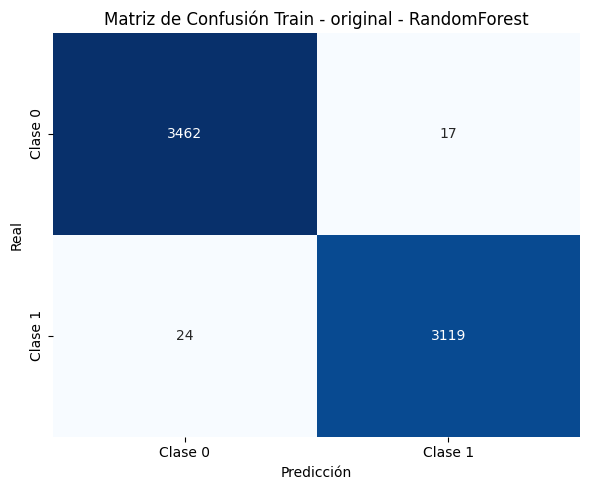

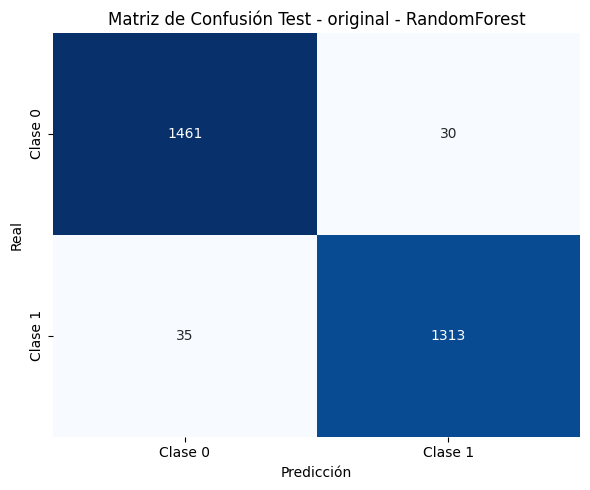


Modelo: LogisticRegression
  Accuracy Train: 0.9135
  Accuracy Test: 0.9091
  F1-score Train: 0.9091
  F1-score: 0.9051
  Reporte de Clasificación Train:
{'0.0': {'precision': 0.9194572748267898, 'recall': 0.9154929577464789, 'f1-score': 0.9174708339334582, 'support': 3479.0}, '1.0': {'precision': 0.9069031032298923, 'recall': 0.9112313076678333, 'f1-score': 0.909062053642279, 'support': 3143.0}, 'accuracy': 0.913470250679553, 'macro avg': {'precision': 0.9131801890283411, 'recall': 0.9133621327071562, 'f1-score': 0.9132664437878686, 'support': 6622.0}, 'weighted avg': {'precision': 0.9134986880963385, 'recall': 0.913470250679553, 'f1-score': 0.9134797743660803, 'support': 6622.0}}
  Reporte de Clasificación Test:
{'0.0': {'precision': 0.9202453987730062, 'recall': 0.9054325955734407, 'f1-score': 0.9127789046653144, 'support': 1491.0}, '1.0': {'precision': 0.8972303206997084, 'recall': 0.9132047477744807, 'f1-score': 0.9051470588235294, 'support': 1348.0}, 'accuracy': 0.90912293060936

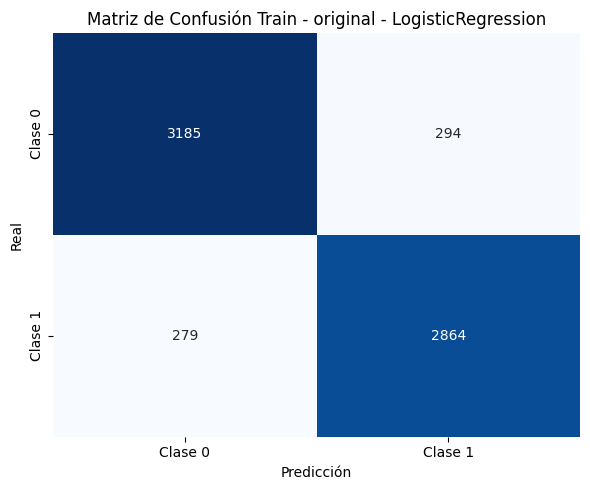

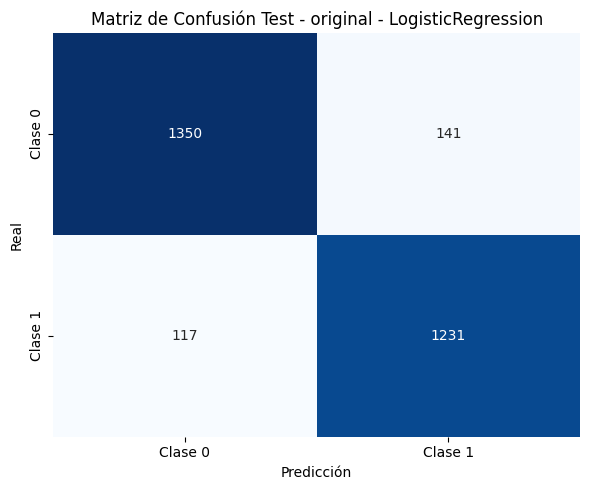


Modelo: KNN
  Accuracy Train: 0.9807
  Accuracy Test: 0.9715
  F1-score Train: 0.9798
  F1-score: 0.9703
  Reporte de Clasificación Train:
{'0.0': {'precision': 0.9877729257641922, 'recall': 0.9752802529462489, 'f1-score': 0.9814868382991032, 'support': 3479.0}, '1.0': {'precision': 0.9730153749607782, 'recall': 0.9866369710467706, 'f1-score': 0.9797788309636651, 'support': 3143.0}, 'accuracy': 0.9806704922983993, 'macro avg': {'precision': 0.9803941503624851, 'recall': 0.9809586119965097, 'f1-score': 0.9806328346313842, 'support': 6622.0}, 'weighted avg': {'precision': 0.980768549114369, 'recall': 0.9806704922983993, 'f1-score': 0.9806761667413741, 'support': 6622.0}}
  Reporte de Clasificación Test:
{'0.0': {'precision': 0.9822161422708618, 'recall': 0.9631120053655265, 'f1-score': 0.9725702675245513, 'support': 1491.0}, '1.0': {'precision': 0.9600580973129993, 'recall': 0.9807121661721068, 'f1-score': 0.9702752293577982, 'support': 1348.0}, 'accuracy': 0.9714688270517788, 'macro av

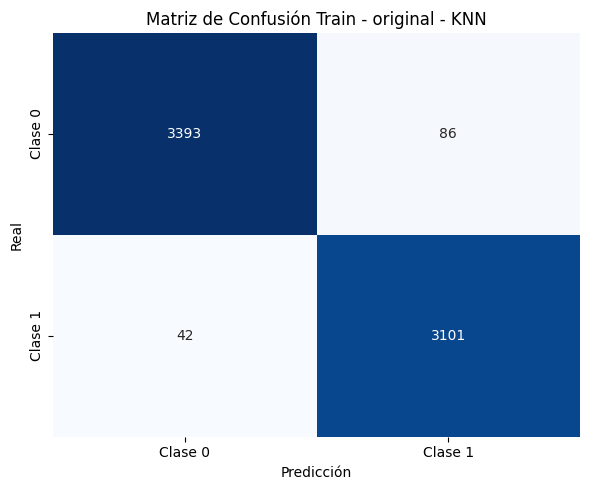

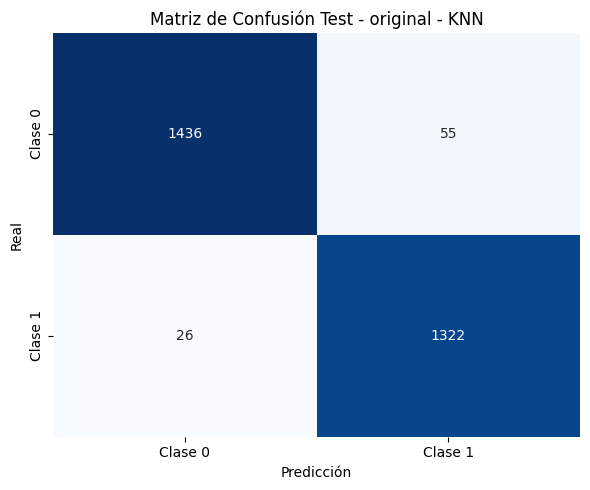


Modelo: SVM
  Accuracy Train: 0.9706
  Accuracy Test: 0.9662
  F1-score Train: 0.9694
  F1-score: 0.9651
  Reporte de Clasificación Train:
{'0.0': {'precision': 0.9826572604350382, 'recall': 0.9609083069847657, 'f1-score': 0.9716610957709635, 'support': 3479.0}, '1.0': {'precision': 0.9577639751552796, 'recall': 0.981228125994273, 'f1-score': 0.9693540782649693, 'support': 3143.0}, 'accuracy': 0.9705527031108426, 'macro avg': {'precision': 0.9702106177951588, 'recall': 0.9710682164895194, 'f1-score': 0.9705075870179665, 'support': 6622.0}, 'weighted avg': {'precision': 0.9708421599164213, 'recall': 0.9705527031108426, 'f1-score': 0.9705661160033192, 'support': 6622.0}}
  Reporte de Clasificación Test:
{'0.0': {'precision': 0.9847116052814454, 'recall': 0.9503688799463448, 'f1-score': 0.967235494880546, 'support': 1491.0}, '1.0': {'precision': 0.9471428571428572, 'recall': 0.983679525222552, 'f1-score': 0.9650655021834061, 'support': 1348.0}, 'accuracy': 0.9661852765058119, 'macro avg'

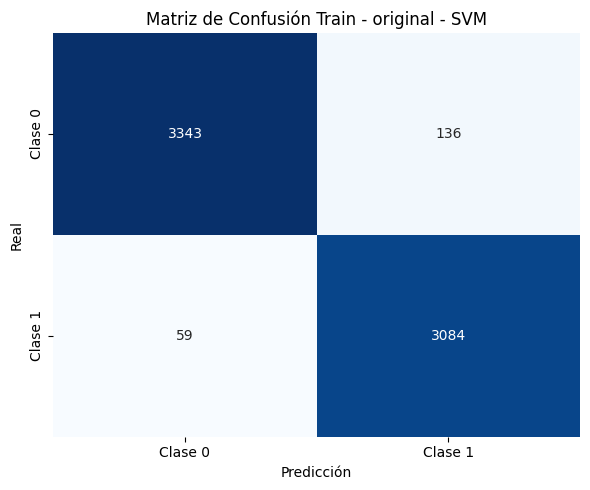

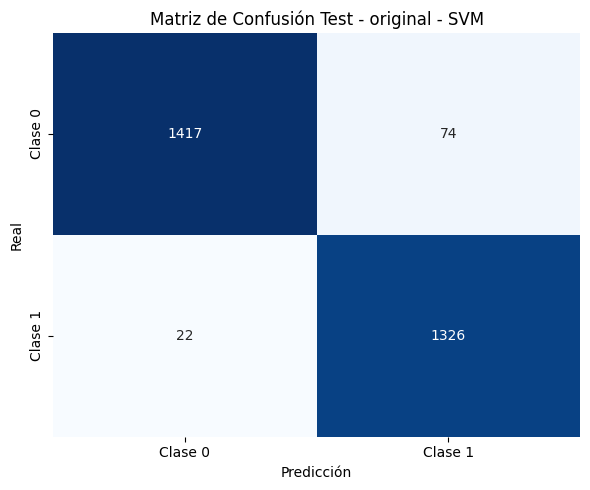


--- Resultados para conjunto: t_estandarizadas ---

Modelo: RandomForest
  Accuracy Train: 0.9890
  Accuracy Test: 0.9718
  F1-score Train: 0.9884
  F1-score: 0.9704
  Reporte de Clasificación Train:
{'0.0': {'precision': 0.9902130109383995, 'recall': 0.9887898821500432, 'f1-score': 0.989500934848267, 'support': 3479.0}, '1.0': {'precision': 0.9876111817026684, 'recall': 0.9891823098950048, 'f1-score': 0.9883961214433318, 'support': 3143.0}, 'accuracy': 0.9889761401389309, 'macro avg': {'precision': 0.988912096320534, 'recall': 0.988986096022524, 'f1-score': 0.9889485281457994, 'support': 6622.0}, 'weighted avg': {'precision': 0.9889781046732373, 'recall': 0.9889761401389309, 'f1-score': 0.9889765572385251, 'support': 6622.0}}
  Reporte de Clasificación Test:
{'0.0': {'precision': 0.9750841750841751, 'recall': 0.9711602951039571, 'f1-score': 0.9731182795698925, 'support': 1491.0}, '1.0': {'precision': 0.9682422451994092, 'recall': 0.9725519287833828, 'f1-score': 0.9703923019985197, 's

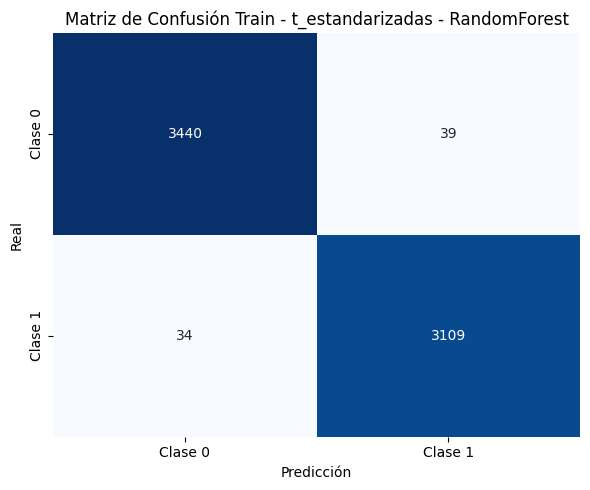

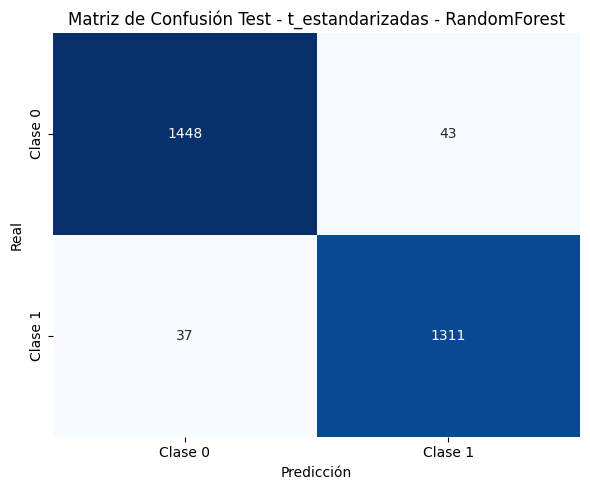


Modelo: LogisticRegression
  Accuracy Train: 0.9135
  Accuracy Test: 0.9190
  F1-score Train: 0.9080
  F1-score: 0.9139
  Reporte de Clasificación Train:
{'0.0': {'precision': 0.9106840022611645, 'recall': 0.9261281977579764, 'f1-score': 0.9183411714407866, 'support': 3479.0}, '1.0': {'precision': 0.9166666666666666, 'recall': 0.8994591154947502, 'f1-score': 0.9079813714469247, 'support': 3143.0}, 'accuracy': 0.913470250679553, 'macro avg': {'precision': 0.9136753344639156, 'recall': 0.9127936566263632, 'f1-score': 0.9131612714438557, 'support': 6622.0}, 'weighted avg': {'precision': 0.9135235543944312, 'recall': 0.913470250679553, 'f1-score': 0.9134240993506767, 'support': 6622.0}}
  Reporte de Clasificación Test:
{'0.0': {'precision': 0.9161716171617161, 'recall': 0.9309188464118041, 'f1-score': 0.9234863606121091, 'support': 1491.0}, '1.0': {'precision': 0.9222054380664653, 'recall': 0.905786350148368, 'f1-score': 0.9139221556886228, 'support': 1348.0}, 'accuracy': 0.91898555829517

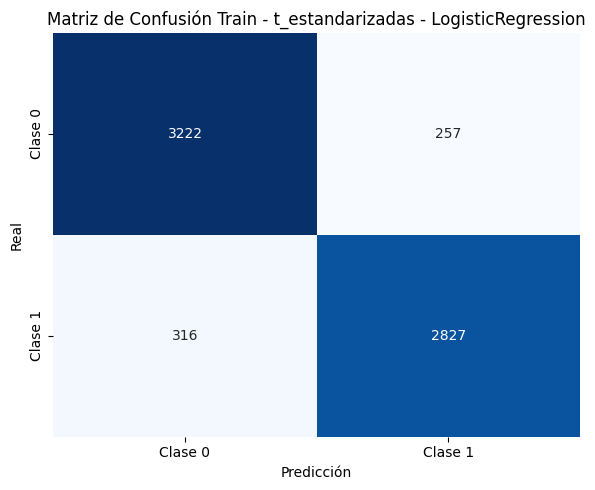

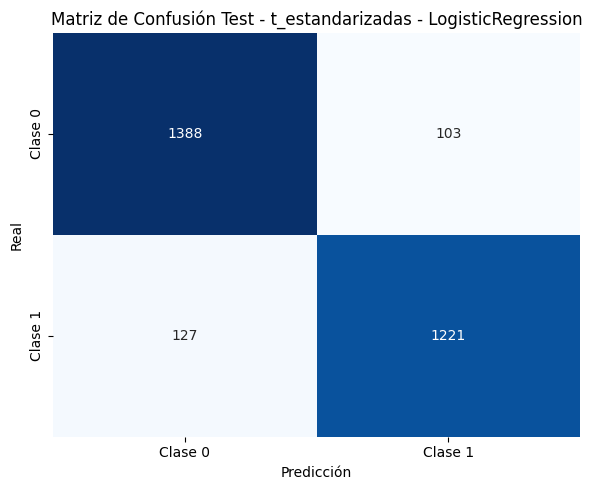


Modelo: KNN
  Accuracy Train: 0.9799
  Accuracy Test: 0.9701
  F1-score Train: 0.9789
  F1-score: 0.9687
  Reporte de Clasificación Train:
{'0.0': {'precision': 0.9846465816917729, 'recall': 0.9770048864616269, 'f1-score': 0.9808108498052229, 'support': 3479.0}, '1.0': {'precision': 0.9747634069400631, 'recall': 0.9831371301304486, 'f1-score': 0.9789323617931253, 'support': 3143.0}, 'accuracy': 0.9799154334038055, 'macro avg': {'precision': 0.979704994315918, 'recall': 0.9800710082960378, 'f1-score': 0.9798716057991741, 'support': 6622.0}, 'weighted avg': {'precision': 0.9799557302504223, 'recall': 0.9799154334038055, 'f1-score': 0.9799192630003266, 'support': 6622.0}}
  Reporte de Clasificación Test:
{'0.0': {'precision': 0.9769335142469471, 'recall': 0.96579476861167, 'f1-score': 0.9713322091062394, 'support': 1491.0}, '1.0': {'precision': 0.9626373626373627, 'recall': 0.9747774480712166, 'f1-score': 0.9686693697014376, 'support': 1348.0}, 'accuracy': 0.9700598802395209, 'macro avg'

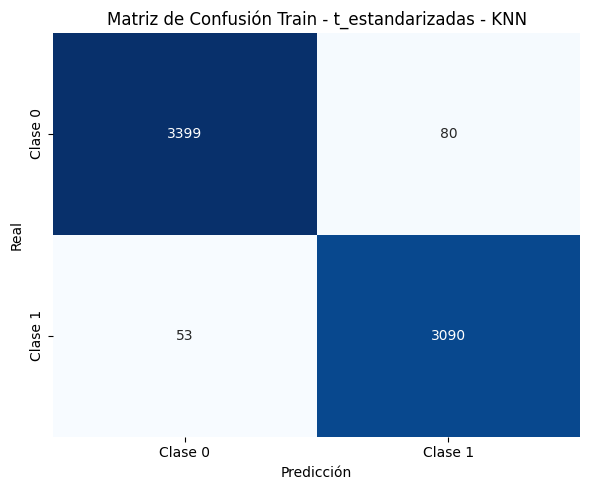

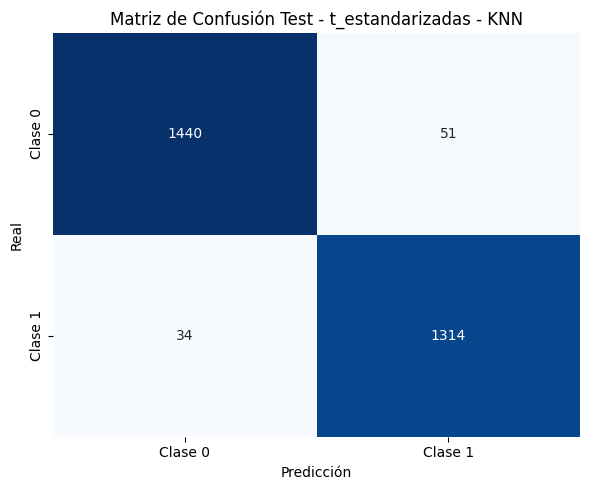


Modelo: SVM
  Accuracy Train: 0.9319
  Accuracy Test: 0.9348
  F1-score Train: 0.9288
  F1-score: 0.9323
  Reporte de Clasificación Train:
{'0.0': {'precision': 0.941656942823804, 'recall': 0.9278528312733544, 'f1-score': 0.934703923555813, 'support': 3479.0}, '1.0': {'precision': 0.9214151534126487, 'recall': 0.9363665287941457, 'f1-score': 0.9288306769764872, 'support': 3143.0}, 'accuracy': 0.9318936877076412, 'macro avg': {'precision': 0.9315360481182263, 'recall': 0.93210968003375, 'f1-score': 0.9317673002661502, 'support': 6622.0}, 'weighted avg': {'precision': 0.9320495818876425, 'recall': 0.9318936877076412, 'f1-score': 0.9319163044076975, 'support': 6622.0}}
  Reporte de Clasificación Test:
{'0.0': {'precision': 0.9491059147180193, 'recall': 0.9255533199195171, 'f1-score': 0.9371816638370118, 'support': 1491.0}, '1.0': {'precision': 0.91985559566787, 'recall': 0.9451038575667656, 'f1-score': 0.9323088181485547, 'support': 1348.0}, 'accuracy': 0.934836209933075, 'macro avg': {'

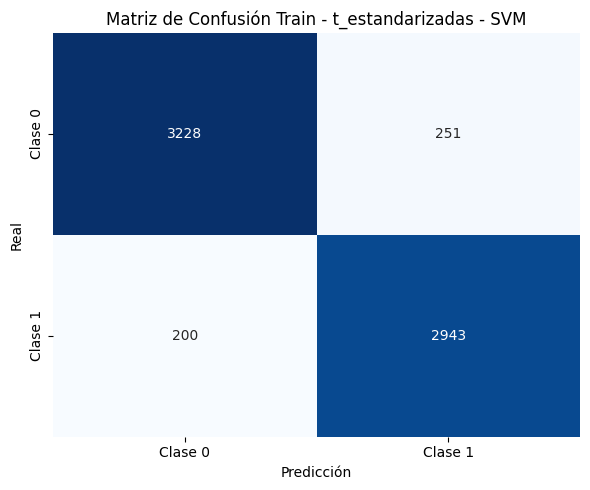

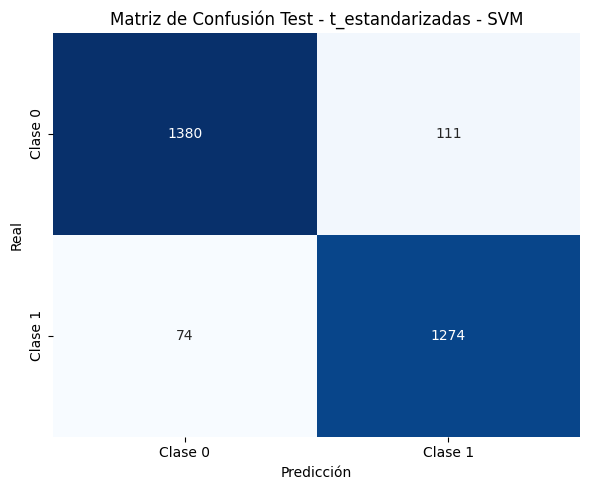


--- Resultados para conjunto: std_calculadas ---

Modelo: RandomForest
  Accuracy Train: 0.9874
  Accuracy Test: 0.9748
  F1-score Train: 0.9860
  F1-score: 0.9720
  Reporte de Clasificación Train:
{'0.0': {'precision': 0.9918981481481481, 'recall': 0.9853406151192872, 'f1-score': 0.9886085075702956, 'support': 3479.0}, '1.0': {'precision': 0.9819978821037769, 'recall': 0.9900355871886121, 'f1-score': 0.9860003544214071, 'support': 2810.0}, 'accuracy': 0.9874383844808395, 'macro avg': {'precision': 0.9869480151259625, 'recall': 0.9876881011539496, 'f1-score': 0.9873044309958514, 'support': 6289.0}, 'weighted avg': {'precision': 0.9874745915279092, 'recall': 0.9874383844808395, 'f1-score': 0.9874431537225652, 'support': 6289.0}}
  Reporte de Clasificación Test:
{'0.0': {'precision': 0.9823728813559321, 'recall': 0.971830985915493, 'f1-score': 0.9770734996628456, 'support': 1491.0}, '1.0': {'precision': 0.9656019656019657, 'recall': 0.9784232365145228, 'f1-score': 0.9719703215169002, 's

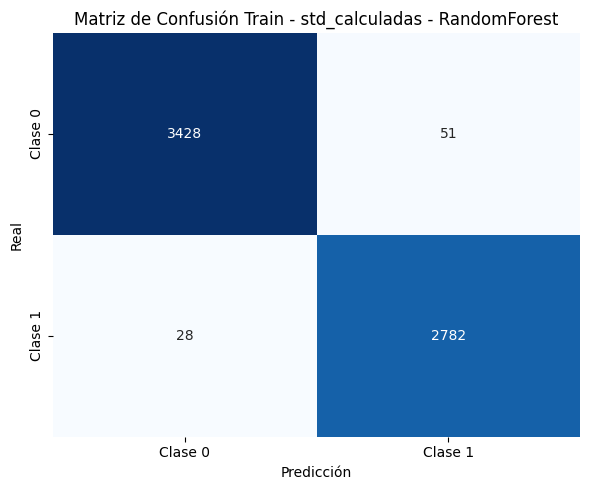

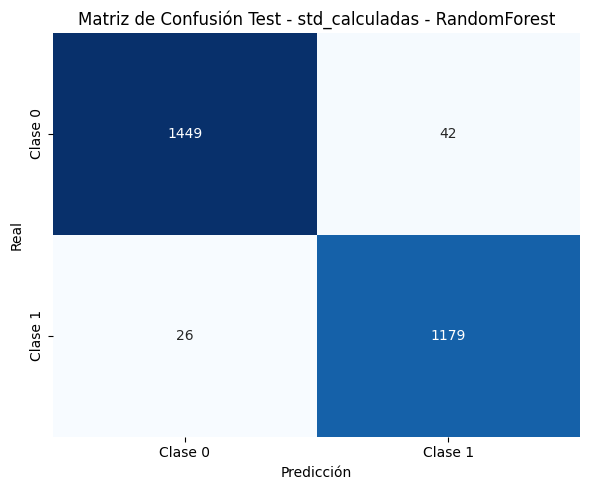


Modelo: LogisticRegression
  Accuracy Train: 0.9197
  Accuracy Test: 0.9284
  F1-score Train: 0.9095
  F1-score: 0.9187
  Reporte de Clasificación Train:
{'0.0': {'precision': 0.9224431818181819, 'recall': 0.933314170738718, 'f1-score': 0.9278468352621803, 'support': 3479.0}, '1.0': {'precision': 0.9162152401589021, 'recall': 0.9028469750889679, 'f1-score': 0.9094819860189998, 'support': 2810.0}, 'accuracy': 0.9197010653522023, 'macro avg': {'precision': 0.919329210988542, 'recall': 0.918080572913843, 'f1-score': 0.91866441064059, 'support': 6289.0}, 'weighted avg': {'precision': 0.9196604634110302, 'recall': 0.9197010653522023, 'f1-score': 0.9196412021927992, 'support': 6289.0}}
  Reporte de Clasificación Test:
{'0.0': {'precision': 0.9247382198952879, 'recall': 0.9476861167002012, 'f1-score': 0.9360715468698244, 'support': 1491.0}, '1.0': {'precision': 0.9332191780821918, 'recall': 0.9045643153526971, 'f1-score': 0.9186683522966709, 'support': 1205.0}, 'accuracy': 0.9284124629080118

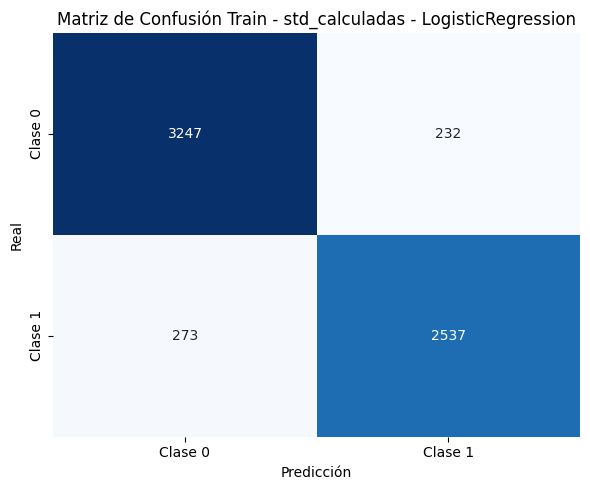

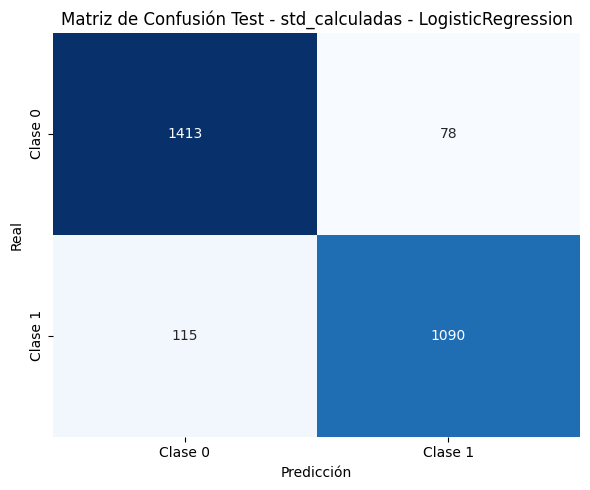


Modelo: KNN
  Accuracy Train: 0.9763
  Accuracy Test: 0.9755
  F1-score Train: 0.9739
  F1-score: 0.9729
  Reporte de Clasificación Train:
{'0.0': {'precision': 0.9908608490566038, 'recall': 0.9660822075308997, 'f1-score': 0.978314655799738, 'support': 3479.0}, '1.0': {'precision': 0.9592682084915429, 'recall': 0.9889679715302491, 'f1-score': 0.9738917119327142, 'support': 2810.0}, 'accuracy': 0.9763078390841151, 'macro avg': {'precision': 0.9750645287740733, 'recall': 0.9775250895305744, 'f1-score': 0.9761031838662261, 'support': 6289.0}, 'weighted avg': {'precision': 0.9767448814961297, 'recall': 0.9763078390841151, 'f1-score': 0.976338431874418, 'support': 6289.0}}
  Reporte de Clasificación Test:
{'0.0': {'precision': 0.9856850715746421, 'recall': 0.9698189134808853, 'f1-score': 0.9776876267748479, 'support': 1491.0}, '1.0': {'precision': 0.9633848657445078, 'recall': 0.9825726141078838, 'f1-score': 0.9728841413311422, 'support': 1205.0}, 'accuracy': 0.9755192878338279, 'macro avg

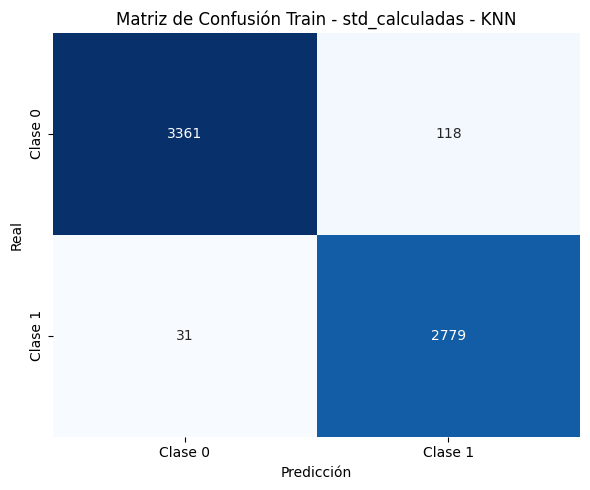

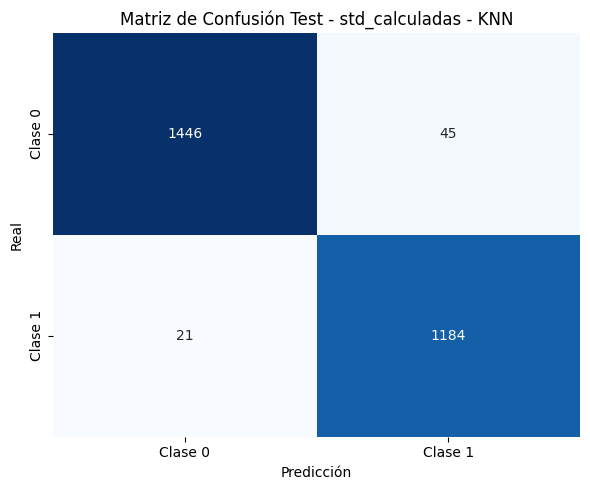


Modelo: SVM
  Accuracy Train: 0.9401
  Accuracy Test: 0.9492
  F1-score Train: 0.9334
  F1-score: 0.9436
  Reporte de Clasificación Train:
{'0.0': {'precision': 0.9508720930232558, 'recall': 0.94021270480023, 'f1-score': 0.9455123572770632, 'support': 3479.0}, '1.0': {'precision': 0.926991926991927, 'recall': 0.9398576512455517, 'f1-score': 0.9333804559109383, 'support': 2810.0}, 'accuracy': 0.9400540626490698, 'macro avg': {'precision': 0.9389320100075914, 'recall': 0.9400351780228908, 'f1-score': 0.9394464065940007, 'support': 6289.0}, 'weighted avg': {'precision': 0.9402021508149502, 'recall': 0.9400540626490698, 'f1-score': 0.9400916794524788, 'support': 6289.0}}
  Reporte de Clasificación Test:
{'0.0': {'precision': 0.9605442176870749, 'recall': 0.9470154258886653, 'f1-score': 0.9537318473488686, 'support': 1491.0}, '1.0': {'precision': 0.935562805872757, 'recall': 0.9518672199170124, 'f1-score': 0.9436445907034142, 'support': 1205.0}, 'accuracy': 0.9491839762611276, 'macro avg':

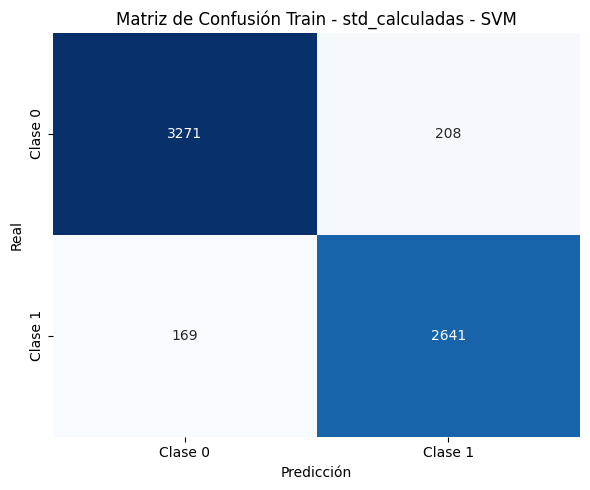

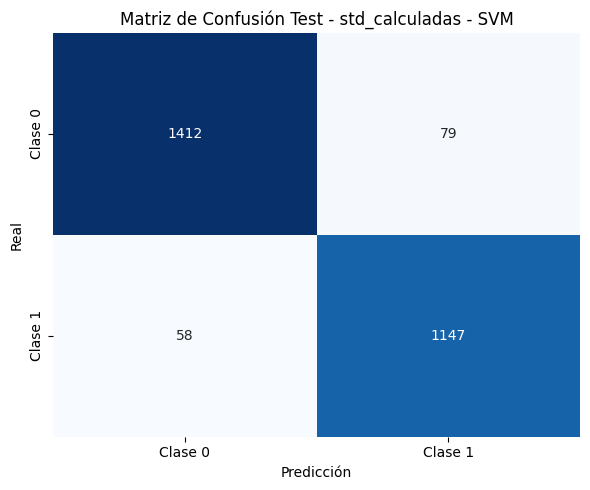

In [89]:
# Dividir los datos en conjunto de entrenamiento y prueba
# Entrenar un modelo de clasificación (por ejemplo, RandomForest)
# Predecir y evaluar el modelo
for nombre, resultado in tsne_resultados.items():
    print(f"\n--- Resultados para conjunto: {nombre} ---")

    X_tsne = resultado['X_tsne']
    y = resultado['labels']

    if hasattr(y, 'isna'):
        mask = ~y.isna()
        X_tsne = X_tsne[mask]
        y = y[mask]

    X_train, X_test, y_train, y_test = train_test_split(
        X_tsne, y, test_size=0.3, random_state=42, stratify=y
    )

    resultados_modelos[nombre] = {}

    for modelo_nombre, modelo in modelos.items():
        modelo.fit(X_train, y_train)
        y_pred = modelo.predict(X_test)
        y_train_pred = modelo.predict(X_train)
        acc_train = accuracy_score(y_train, y_train_pred)
        acc = accuracy_score(y_test, y_pred)
        f1_train = f1_score(y_train, y_train_pred)
        f1 = f1_score(y_test, y_pred)
        cm_train = confusion_matrix(y_train, y_train_pred)
        cm = confusion_matrix(y_test, y_pred)
        cr_train = classification_report(y_train, y_train_pred, output_dict=True)
        cr = classification_report(y_test, y_pred, output_dict=True)

        print(f"\nModelo: {modelo_nombre}")
        print(f"  Accuracy Train: {acc_train:.4f}")
        print(f"  Accuracy Test: {acc:.4f}")
        print(f"  F1-score Train: {f1_train:.4f}")
        print(f"  F1-score: {f1:.4f}")
        print("  Reporte de Clasificación Train:")
        print(cr_train)
        print("  Reporte de Clasificación Test:")
        print(cr)

        plt.figure(figsize=(6, 5))
        sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', cbar=False,
                    xticklabels=['Clase 0', 'Clase 1'], yticklabels=['Clase 0', 'Clase 1'])
        plt.title(f"Matriz de Confusión Train - {nombre} - {modelo_nombre}")
        plt.xlabel("Predicción")
        plt.ylabel("Real")
        plt.tight_layout()
        plt.show()

        plt.figure(figsize=(6, 5))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
                    xticklabels=['Clase 0', 'Clase 1'], yticklabels=['Clase 0', 'Clase 1'])
        plt.title(f"Matriz de Confusión Test - {nombre} - {modelo_nombre}")
        plt.xlabel("Predicción")
        plt.ylabel("Real")
        plt.tight_layout()
        plt.show()

        resultados_modelos[nombre][modelo_nombre] = {
            "modelo": modelo,
            "accuracy": acc,
            "f1_score": f1,
            "classification_report": cr,
            "confusion_matrix": cm
        }

- **Random Forest** es el modelo más robusto en ambos conjuntos. Tiene el mejor desempeño general con un mínimo overfitting, especialmente en el conjunto original.
- **KNN** también se comporta bien, pero muestra un ligero descenso con datos estandarizados. Es más sensible a la escala de los datos, por lo que la estandarización ayuda a evitar sobreajuste.
- **SVM** mejora significativamente con estandarización, lo cual es esperado ya que depende de distancias. Aumenta de ~96.6% a ~93.5% en accuracy, manteniendo un balance razonable.
- **Logistic Regression** mejora con la estandarización. Su F1-score sube de 0.905 a 0.9139. Dado que es un modelo lineal, se beneficia mucho de datos normalizados.

#### ¿Se puede utilizar la reducción de dimensinalidad obtenida por t-SNE para entrenar un algoritmo de clasificación?

Técnicamente sí se puede usar t-SNE para entrenar un clasificador, pero no es recomendable ni confiable para producción. En ciertos casos, si se tiene muy pocos datos, bien separados por clases y se usa t-SNE seguido de un clasificador simple, se puede obtener buenos resultados en ese conjunto específico. Sin embargo, el problema es que t-SNE no es una transformación fija, no generaliza a nuevos datos. Por eso, aunque se pueda obtener buen rendimiento como es este caso, no es robusto ni replicable a escala o en escenarios reales.

### PCS vs t-SNE

- **PCA** conserva mayor información relevante para clasificación y permite a los modelos mantener un rendimiento alto, incluso similar al dataset original en algunos casos (especialmente SVM y Logistic Regression).
- **t-SNE** es más adecuado para visualización, no para tareas supervisadas como clasificación.
- Modelos más robustos (como RandomForest y SVM) aún se ven muy afectados por t-SNE, lo que sugiere pérdida de información estructural relevante para clasificar.

Para clasificación, **PCA** es claramente superior a t-SNE en este caso.

### LDA

In [90]:
data = pd.read_csv(file_path)

In [91]:
# Descargar las palabras vacías en español
import nltk
import re
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

nltk.download('stopwords')
stop_words = set(stopwords.words('spanish'))


# Preprocesar la columna 'comentario'
def preprocess_text(text):
    text = text.lower()
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
    text = re.sub(r'[^a-záéíóúñü\s]', '', text)
    tokens = [word for word in text.split() if word not in stop_words and len(word) > 2]
    return ' '.join(tokens)

data['comentario_clean'] = data['comentario'].astype(str).apply(preprocess_text)

vectorizer = CountVectorizer(max_df=0.95, min_df=2, max_features=1000)
X = vectorizer.fit_transform(data['comentario_clean'])

# Aplicar LDA
num_topics = 5
lda = LatentDirichletAllocation(n_components=num_topics, random_state=42)
lda.fit(X)

# Mostrar los temas
def mostrar_temas(model, vectorizer, top_n=10):
    palabras = vectorizer.get_feature_names_out()
    for i, topic in enumerate(model.components_):
        print(f"--- Tema {i+1} ---")
        top_features_ind = topic.argsort()[:-top_n - 1:-1]
        top_features = [palabras[i] for i in top_features_ind]
        pesos = topic[top_features_ind]
        print(", ".join(top_features))
        print()

mostrar_temas(lda, vectorizer)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


--- Tema 1 ---
hdlgp, gentuzar, basura, panfleto, verguenza, putamadre, hijogranputa, mundobasuraperiodistico, putochino, racistamierdo

--- Tema 2 ---
terroristainformativo, hijoputo, asco, imbecil, mierda, mentiroso, panfletoasquerosoreaccionariovomitivo, lameculo, cosavoxpasarianpartidopacifistaamorosoradicalfascistalocorepitolocofascistavuelvoinsistirlocovox, manipulador

--- Tema 3 ---
idiota, escorio, putaverguenza, gilipollez, golfo, inutil, patetico, menudogilipol, polla, estupidoperiodistadecirmuerteneumoniaejemplomasimbecil

--- Tema 4 ---
poderseguirbabeliafacebooktwitterapuntarteaquirecibirnewslettersemanal, sinverguenza, miserable, hijoputa, vaisarrestarilegalmenteputamadre, idomierdo, daiasco, mierdar, guardiacivilevacuadopersonaafectadonuevovolcarpalmacanariasentrarerupciondomingohoralocalmontañarajadozonaforestalcabezavacopasonivelemergenciapasadosemafororojoislirhoralocalafectarmunicipiotazacortarpasofuencalientemazollanoaridaneunopersonatotalserevacuarvecinozónalcalap

Preprocesamiento: Este paso convierte el texto en una matriz de términos.
Aplicación de LDA: Ejecuta el algoritmo LDA para encontrar los temas.
Visualización de Temas: Imprime los temas encontrados con las palabras más representativas.